In [1]:
%load_ext autoreload
%autoreload 2

In [23]:
import sys
sys.path.append('/tank/klundert/projects/cfdn/prfpy_cfdn/')
import os
import numpy as np
import preprocess
import glob
import natsort
import cortex as cx
import numpy as np
import scipy as sp
from scipy.stats import sem
from scipy.stats import f_oneway
import scikit_posthocs as sp
import h5py
import nibabel as nb
from nilearn.surface import load_surf_data
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import nibabel as nb
import seaborn as sns



In [3]:
idxs = h5py.File('/tank/shared/timeless/atlases/cifti_indices.hdf5', "r")
lidxs = np.array(idxs['Left_indices'])
ridxs = np.array(idxs['Right_indices'])
allidxs = np.concatenate([lidxs, ridxs])
def get_cortex(dat):
    l, r, = dat[lidxs], dat[ridxs]

    # Replace the minus 1
    l[lidxs == -1] = np.zeros_like(l[lidxs == -1])
    r[ridxs == -1] = np.zeros_like(r[ridxs == -1])

    # Last dimension time.
    # l, r = l.T, r.T

    data = np.concatenate([l, r])
    return data

def angle(x0, y0):
    return np.angle(x0 + y0 * 1j)

def ecc(x0, y0):
    return np.abs(x0 + y0 * 1j)

def splitList(array):
    n = len(array)
    half = int(n/2) # py3
    return array[:half], array[n-half:]


def load_wang(space, wcard='{hem}.wang_{space}.label.gii',wangloc='/tank/klundert/fsphere/'):
    ldat,rdat=nb.load(os.path.join(wangloc,wcard.format(hem='L',space=space))),nb.load(os.path.join(wangloc,wcard.format(hem='R',space=space)))
    fulldat=np.concatenate([ldat.agg_data(),rdat.agg_data()])
    return fulldat

atlas_data = load_wang('HCP')

roi_index_dict = {
    'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'hV4':  7, 'VO1':  8, 'VO2':  9, 'PHC1':  10, 'PHC2':  11,
    'TO2':  12, 'TO1':  13, 'LO2':  14, 'LO1':  15, 'V3B':  16, 'V3A':  17, 'IPS0':  18, 'IPS1':  19, 'IPS2':  20, 'IPS3':  21, 'IPS4': 22,
    'IPS5':  23, 'SPL1':  24, 'FEF': 25}

roi_index_dict2 = {
    'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'V3AB':  [16, 17], 'hV4':  7, 'VO':  [8, 9], 'PHC':  [10, 11],
    'TO':  [12, 13], 'LO':  [14, 15], 'IPS':  [18, 19, 20, 21, 22, 23], 'SPL1':  24, 'FEF': 25}


roimask = np.isin(atlas_data, roi_index_dict['V2'])
for l, ROI in enumerate(list(roi_index_dict)[1:]):
    roimask = np.isin(atlas_data, roi_index_dict[ROI]) + roimask
    
V3mask = np.isin(atlas_data, roi_index_dict['V3'])

In [4]:
def get_blend(Vertex, threshold=0, brightness=0.6,
                    contrast=0.25, smooth=20):
    """Blend the data with a curvature map depending on a transparency map.

    Vertex objects cannot use transparency as Volume objects. This method
    is a hack to mimic the transparency of Volume objects, blending the
    Vertex data with a curvature map. This method returns a VertexRGB
    object, and the colormap parameters (vmin, vmax, cmap, ...) of the
    original Vertex object cannot be changed later on.
    Parameters
    ----------
    Vertex : Vertex you want to plot
        Vertex you want to plot.
    alpha : array of shape (n_vertices, )
        Transparency map.
    threshold : float
        Threshold for the curvature map.
    brightness : float
        Brightness of the curvature map.
    contrast : float
        Contrast of the curvature map.
    smooth : float
        Smoothness of the curvature map.

    Returns
    -------
    blended : VertexRGB object
        The original map blended with a curvature map.
    """
    
    alpha = (~np.isnan(Vertex.data)).astype("float")

    curvature = cx.db.get_surfinfo('hcp_999999').data
    curvature = (curvature > 0).astype("float")
    curvature = curvature * contrast + brightness
    curvature_raw = cx.Vertex(curvature, subject='hcp_999999', vmin=0, vmax=1, cmap='gray').raw
    alpha = np.clip(alpha, 0, 1)  
    blended = deepcopy(Vertex.raw)  # copy because VertexRGB.raw returns self
    blended.red.data = blended.red.data * alpha + (1 - alpha) * curvature_raw.red.data
    blended.green.data = blended.green.data * alpha + (1 - alpha) * curvature_raw.green.data
    blended.blue.data = blended.blue.data * alpha + (1 - alpha) * curvature_raw.blue.data
    blended.red.data = blended.red.data.astype("uint8")
    blended.green.data = blended.green.data.astype("uint8")
    blended.blue.data = blended.blue.data.astype("uint8")

    
    return blended

In [5]:
def add_sign_plot_bar():
    vh = 0.08
    hh = 0.11
    barh = np.amax([np.nanmean(rdiff[boolmask2]), np.nanmean(rdiff2[boolmask2]), np.nanmean(rdiff3[boolmask2])])
    if tt[2][3] < 0.05:
        
        plt.plot([l+width*2,l+width*2], [barh+hh, barh+vh], c='cornflowerblue')
        plt.plot([l+width,l+width], [barh+hh, barh+vh], c='coral')
        plt.plot([l+width,l+width*2], [barh+hh, barh+hh], c='black')
        pval_str = ""
        if tt[2][3] < 0.05:
            pval_str+="*"
            if tt[2][3] < 0.01:
                pval_str+="*"
                if tt[2][3] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."
        plt.text(l+width*1.2, barh+hh+0.01, pval_str, weight = 'bold',)

        vh = vh + 0.1
        hh = hh + 0.1
    
    if tt[2][1] < 0.05:

        plt.plot([l+width,l+width], [barh+hh, barh+vh], c='coral')
        plt.plot([l,l], [barh+hh, barh+vh], c='teal')
        plt.plot([l,l+width], [barh+hh, barh+hh], c='black')

        pval_str = ""
        if tt[2][1] < 0.05:
            pval_str+="*"
            if tt[2][1] < 0.01:
                pval_str+="*"
                if tt[2][1] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."
        plt.text(l, barh+hh+0.01, pval_str, weight = 'bold')

        vh = vh + 0.1
        hh = hh + 0.1

    if tt[3][1] < 0.05:
    
        plt.plot([l+width*2,l+width*2], [barh+hh, barh+vh], c='cornflowerblue')
        plt.plot([l,l], [barh+hh, barh+vh], c='teal')
        plt.plot([l,l+width*2], [barh+hh, barh+hh], c='black')

        pval_str = ""
        if tt[3][1] < 0.05:
            pval_str+="*"
            if tt[3][1] < 0.01:
                pval_str+="*"
                if tt[3][1] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."

        plt.text(l+width/2, barh+hh+0.01, pval_str, weight = 'bold')
        
        
        
def add_sign_plot_bar2():
    vh = 0.08
    hh = 0.11
    barh = np.amax([np.nanmean(rdiff[boolmask2]), np.nanmean(rdiff2[boolmask2])])

    
    if tt[2][1] < 0.05:

        plt.plot([l+width,l+width], [barh+hh, barh+vh], c='coral')
        plt.plot([l,l], [barh+hh, barh+vh], c='teal')
        plt.plot([l,l+width], [barh+hh, barh+hh], c='black')

        pval_str = ""
        if tt[2][1] < 0.05:
            pval_str+="*"
            if tt[2][1] < 0.01:
                pval_str+="*"
                if tt[2][1] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."
        plt.text(l, barh+hh+0.01, pval_str, weight = 'bold')

        vh = vh + 0.1
        hh = hh + 0.1

    
def add_sign_plot_violin():
    vh = 0.08
    hh = 0.11
    barh = np.amax([np.nanmax(rdiff[boolmask2]), np.nanmax(rdiff2[boolmask2]), np.nanmax(rdiff3[boolmask2])])
    if tt[2][3] < 0.05:
        
        plt.plot([l+width*2,l+width*2], [barh+hh, barh+vh], c='cornflowerblue')
        plt.plot([l+width,l+width], [barh+hh, barh+vh], c='coral')
        plt.plot([l+width,l+width*2], [barh+hh, barh+hh], c='black')
        pval_str = ""
        if tt[2][3] < 0.05:
            pval_str+="*"
            if tt[2][3] < 0.01:
                pval_str+="*"
                if tt[2][3] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."
        plt.text(l+width*1.2, barh+hh+0.01, pval_str, weight = 'bold',)

        vh = vh + 0.1
        hh = hh + 0.1
    
    if tt[2][1] < 0.05:

        plt.plot([l+width,l+width], [barh+hh, barh+vh], c='coral')
        plt.plot([l,l], [barh+hh, barh+vh], c='teal')
        plt.plot([l,l+width], [barh+hh, barh+hh], c='black')

        pval_str = ""
        if tt[2][1] < 0.05:
            pval_str+="*"
            if tt[2][1] < 0.01:
                pval_str+="*"
                if tt[2][1] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."
        plt.text(l, barh+hh+0.01, pval_str, weight = 'bold')

        vh = vh + 0.1
        hh = hh + 0.1

    if tt[3][1] < 0.05:
    
        plt.plot([l+width*2,l+width*2], [barh+hh, barh+vh], c='cornflowerblue')
        plt.plot([l,l], [barh+hh, barh+vh], c='teal')
        plt.plot([l,l+width*2], [barh+hh, barh+hh], c='black')

        pval_str = ""
        if tt[3][1] < 0.05:
            pval_str+="*"
            if tt[3][1] < 0.01:
                pval_str+="*"
                if tt[3][1] < 0.001:
                    pval_str+="*"
        else:
            pval_str+="n.s."

        plt.text(l+width/2, barh+hh+0.01, pval_str, weight = 'bold')

In [175]:
sub = 2

dn_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_norm_weighted.npy'))
gauss_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_gauss_weighted.npy'))

dncf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_norm_weighted_fullbrain.npy')
cf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_gauss_weighted_fullbrain.npy')

# brainmask = np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/roimask_wang_hcp.npy')
brainmask = np.load('/tank/klundert/DMs/brainmask_sub-02.npy')

In [173]:
sub = 2

dn_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_norm_weighted.npy'))
gauss_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_gauss_weighted.npy'))

dncf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_norm_weighted.npy')
cf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_gauss_weighted.npy')

brainmask = np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/roimask_wang_hcp.npy')

In [150]:
sub = 2

dn_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_norm.npy'))
gauss_prf = get_cortex(np.load(f'/tank/klundert/data_hcp-space_cf/pRF-params_sub-0{sub}_gauss.npy'))

dncf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_norm.npy')
cf_cortical = np.load(f'/tank/klundert/data_hcp-space_cf/CF-params_sub-0{sub}_gauss.npy')

brainmask = np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/roimask_wang_hcp.npy')


In [ ]:
cx.vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1)

/tmp/ipykernel_2298842/822423825.py:28: RuntimeWarning: invalid value encountered in divide
  toplot[brainmask] = dncf_cortical[:,5]/dncf_cortical[:,0]


Text(0.5, 1.0, 'size ratio CF Norm sub-01')

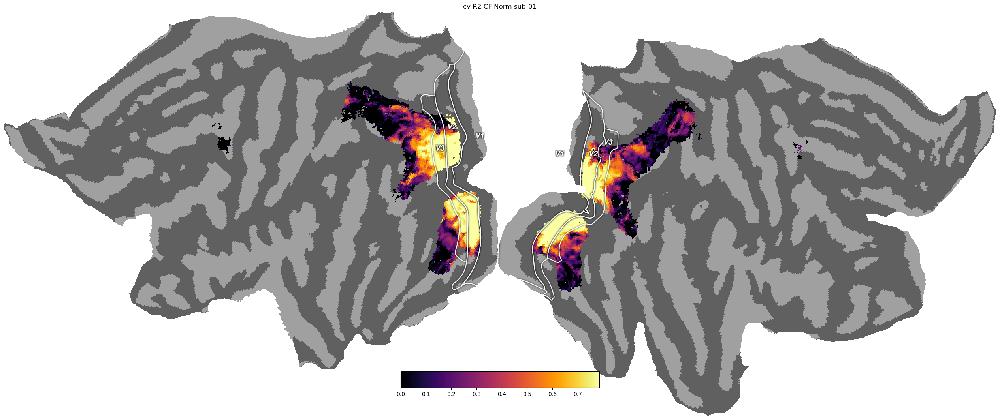

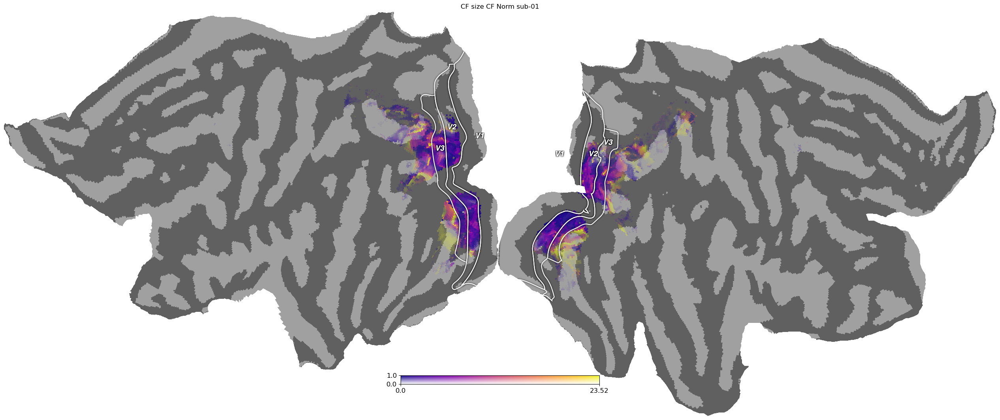

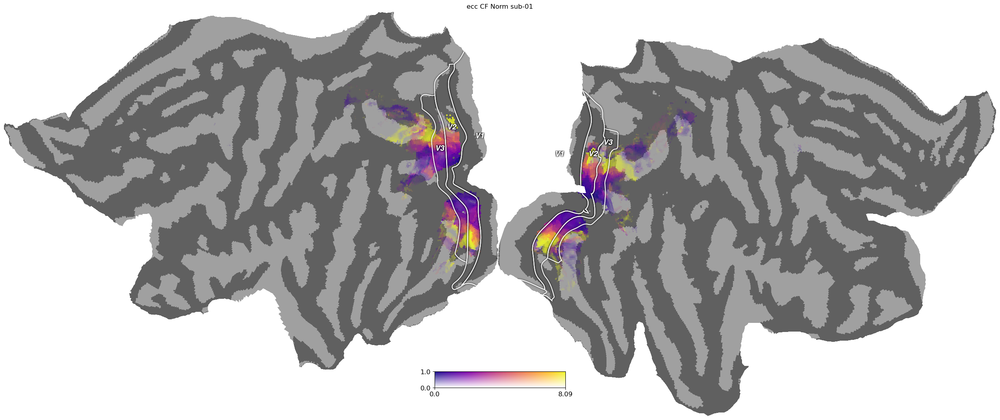

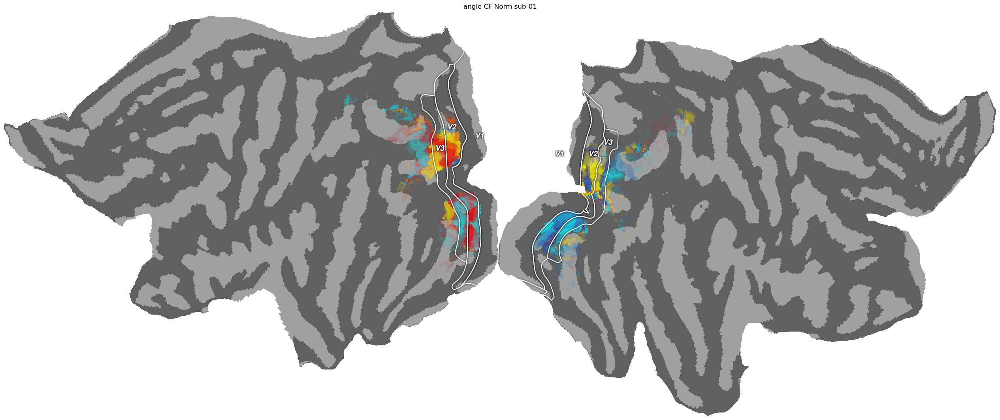

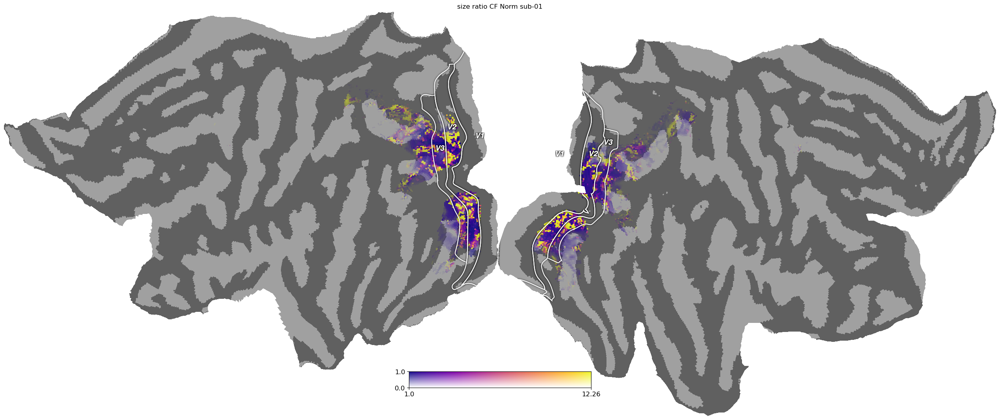

In [131]:
rsq_norm = np.zeros([118584,])
rsq_norm[:] = np.nan
rsq_norm[brainmask] = dncf_cortical[:,-3]
cx.quickshow(cx.Vertex(rsq_norm, subject='hcp_999999', cmap='inferno', vmin=0), with_curvature=True, with_colorbar=True);
plt.title(f'cv R2 CF Norm sub-0{sub}')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,0]
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'CF size CF Norm sub-0{sub}')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = ecc(cf_cortical[:,-1], cf_cortical[:,-2]*-1)
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'ecc CF Norm sub-0{sub}')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = angle(cf_cortical[:,-1], cf_cortical[:,-2]*-1)
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='Retinotopy_RYBCR_alpha', vmin=-np.pi, vmax=np.pi, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=False);
plt.title(f'angle CF Norm sub-0{sub}')


toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,5]/dncf_cortical[:,0]
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=1, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'size ratio CF Norm sub-0{sub}')


In [ ]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,5]/dncf_cortical[:,0]
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=1, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'size ratio CF Norm sub-0{sub}')

/tmp/ipykernel_2298842/4006604203.py:3: RuntimeWarning: invalid value encountered in divide
  toplot[brainmask] = (dn_prf[:,6]/dn_prf[:,2])[brainmask]


Text(0.5, 1.0, 'size ratio pRF Norm sub-01')

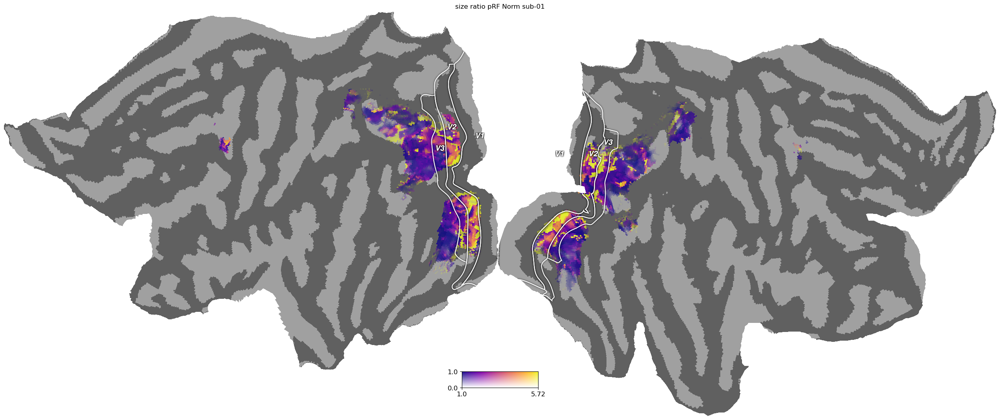

In [135]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = (dn_prf[:,6]/dn_prf[:,2])[brainmask]
cx.quickshow(cx.Vertex2D(toplot, dn_prf[:,-1], subject='hcp_999999', cmap='plasma_alpha', vmin=1, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'size ratio pRF Norm sub-0{sub}')

Text(0.5, 1.0, 'pRF norm B sub-02')

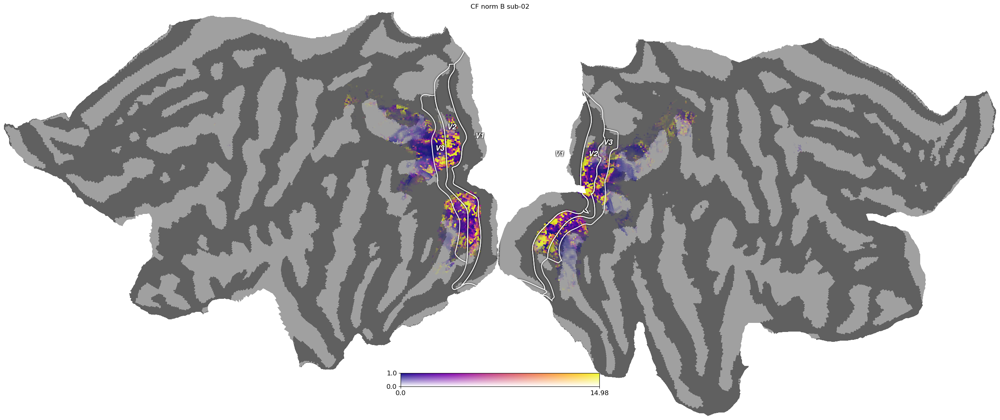

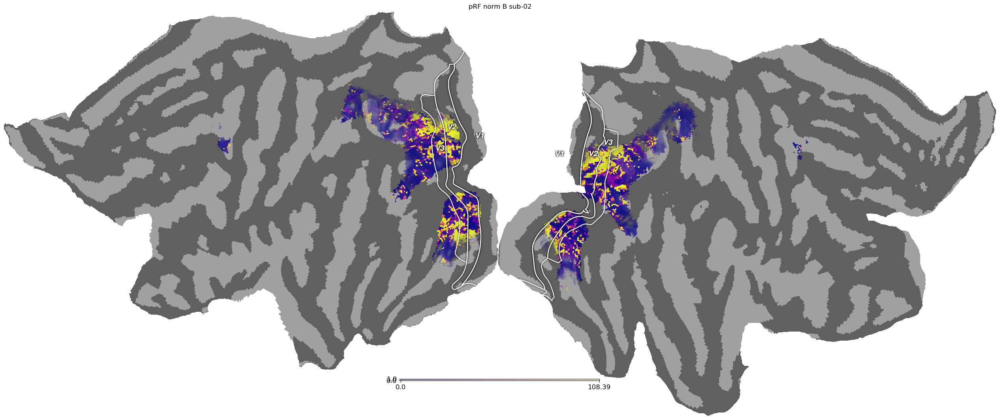

In [198]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,6]
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'CF norm B sub-0{sub}')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dn_prf[:,7][brainmask]
cx.quickshow(cx.Vertex2D(toplot, dn_prf[:,-1], subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'pRF norm B sub-0{sub}')

Text(0.5, 1.0, 'pRF norm D sub-01')

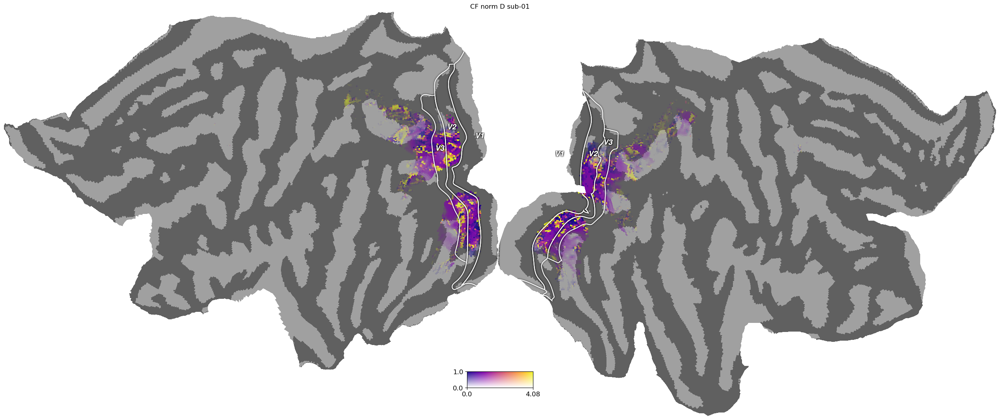

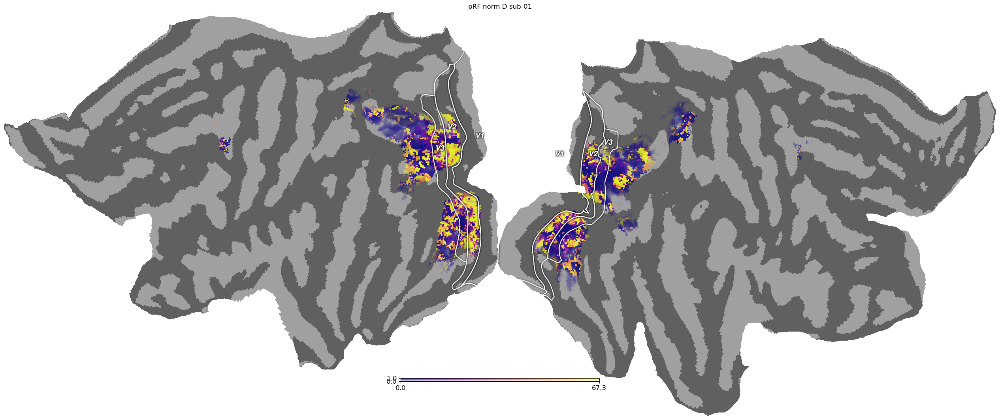

In [138]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,7]
cx.quickshow(cx.Vertex2D(toplot, rsq_norm, subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'CF norm D sub-0{sub}')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dn_prf[:,8][brainmask]
cx.quickshow(cx.Vertex2D(toplot, dn_prf[:,-1], subject='hcp_999999', cmap='plasma_alpha', vmin=0, vmin2=0,vmax2=1), with_curvature=True, with_colorbar=True);
plt.title(f'pRF norm D sub-0{sub}')

Text(0.5, 1.0, 'CF - pRF cv Rsq sub-02')

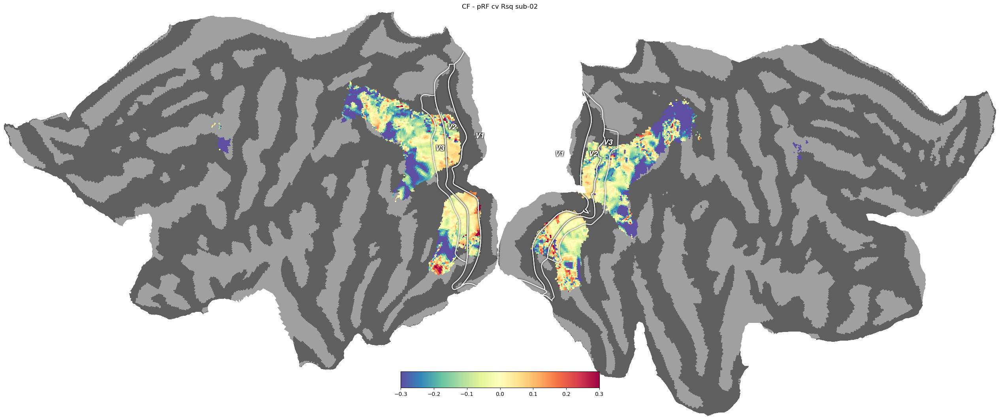

In [174]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.nan_to_num(dncf_cortical[:,-3]) - np.nan_to_num(dn_prf[:,-1])[brainmask]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='spectral_r', vmin=-0.3, vmax=0.3), with_curvature=True);
plt.title(f'CF - pRF cv Rsq sub-0{sub}')



Text(0.5, 1.0, 'norm')

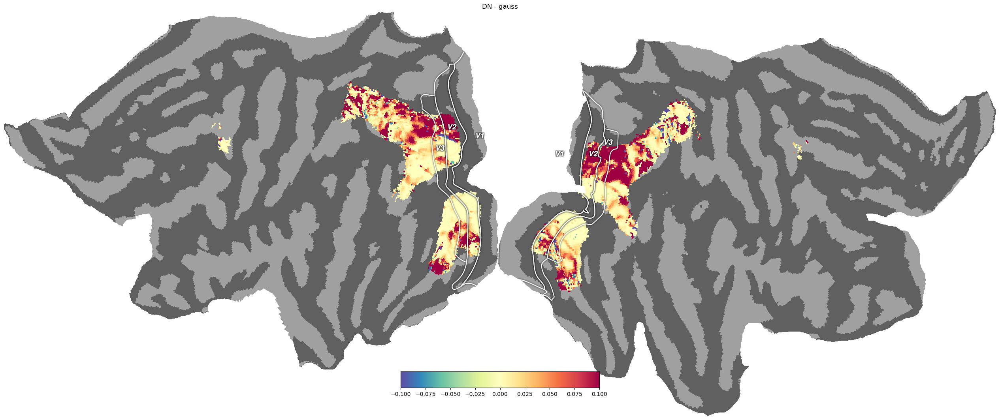

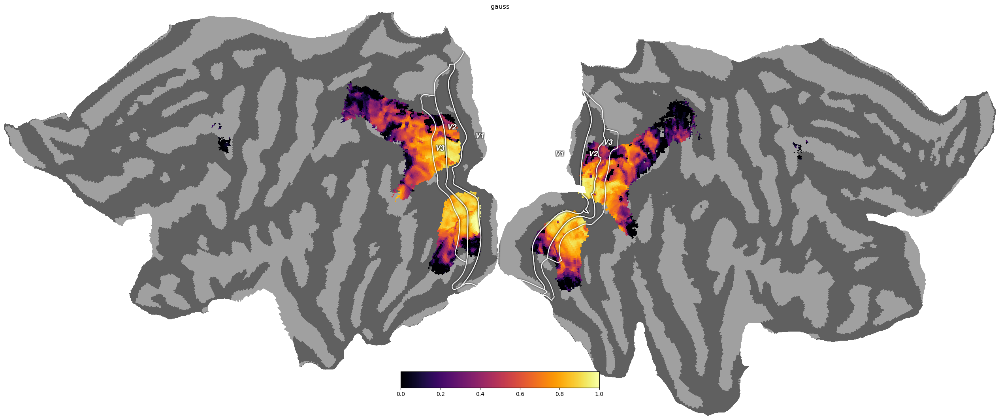

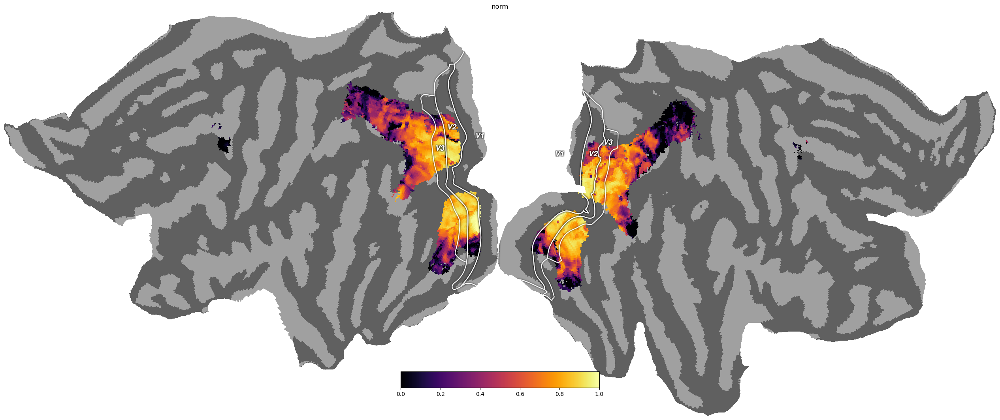

In [167]:

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.nan_to_num(dncf_cortical[:,-3]) - np.nan_to_num(cf_cortical[:,-3])
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='spectral_r', vmin=-0.1, vmax=0.1), with_curvature=True);
plt.title('DN - gauss')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = cf_cortical[:,-3]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1), with_curvature=True);
plt.title('gauss')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,-3]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1), with_curvature=True);
plt.title('norm')

/tank/klundert/software/pycortex/cortex/dataset/view2D.py:284: UserWarning: Colormap 'RdBu_covar' is not perceptually uniform. Consider using 'PU_RdBu_covar' instead.
  warnings.warn("Colormap %r is not perceptually uniform. Consider using"


Text(0.5, 1.0, 'norm')

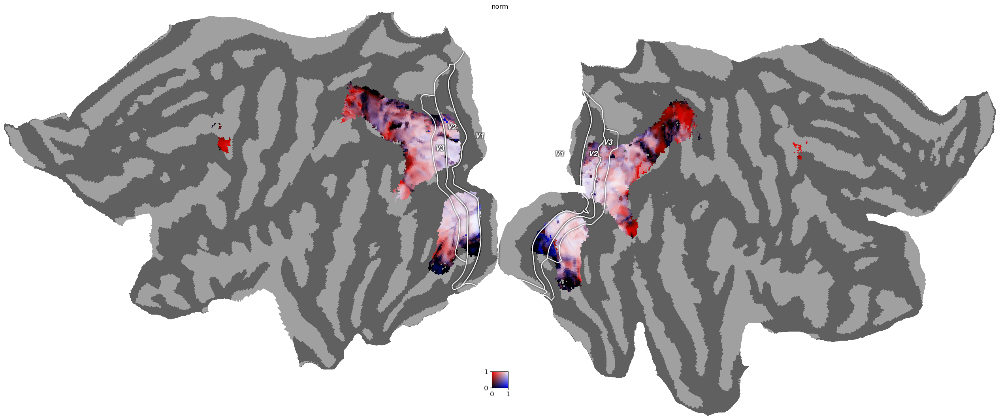

In [190]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = dncf_cortical[:,-3]

toplot2 = np.zeros([118584,])
toplot2[:] = np.nan
toplot2[brainmask] = dn_prf[:,-1][brainmask]

cx.quickshow(cx.Vertex2D(toplot, toplot2, subject='hcp_999999', vmin=0, vmax=1, vmin2=0, vmax2=1), with_curvature=True);
plt.title('')

/tmp/ipykernel_2298842/1626602204.py:55: RuntimeWarning: invalid value encountered in divide
  toplot[brainmask] = np.copy((dn_prf[:,6]/dn_prf[:,2])[brainmask])


Text(0.5, 0, 'ROI')

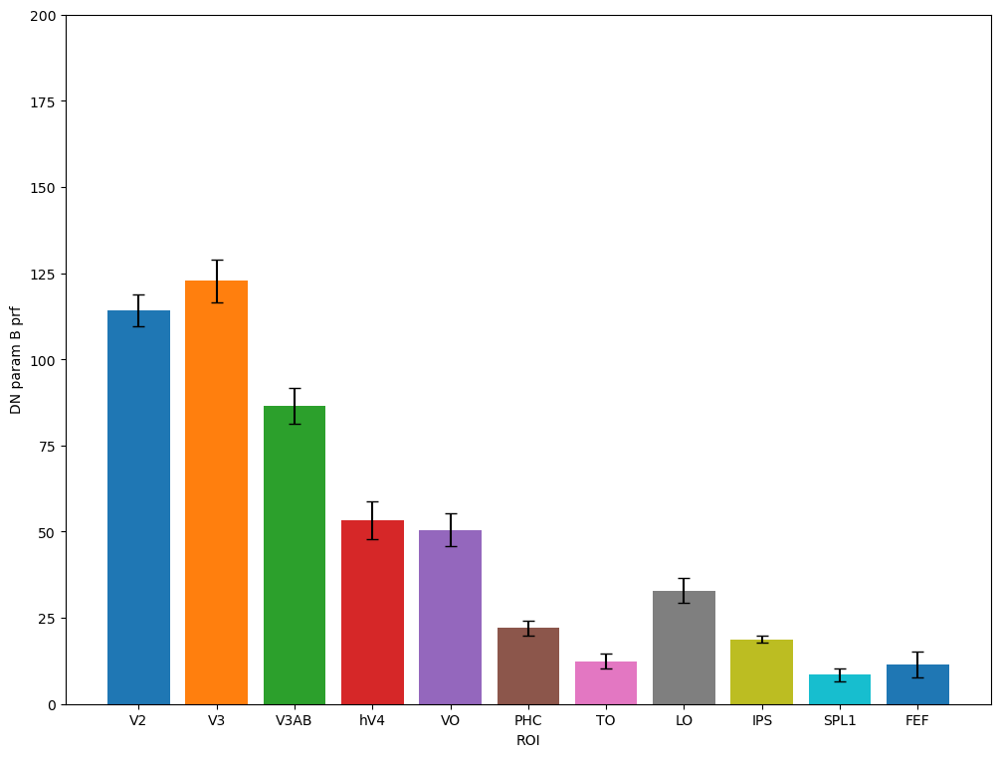

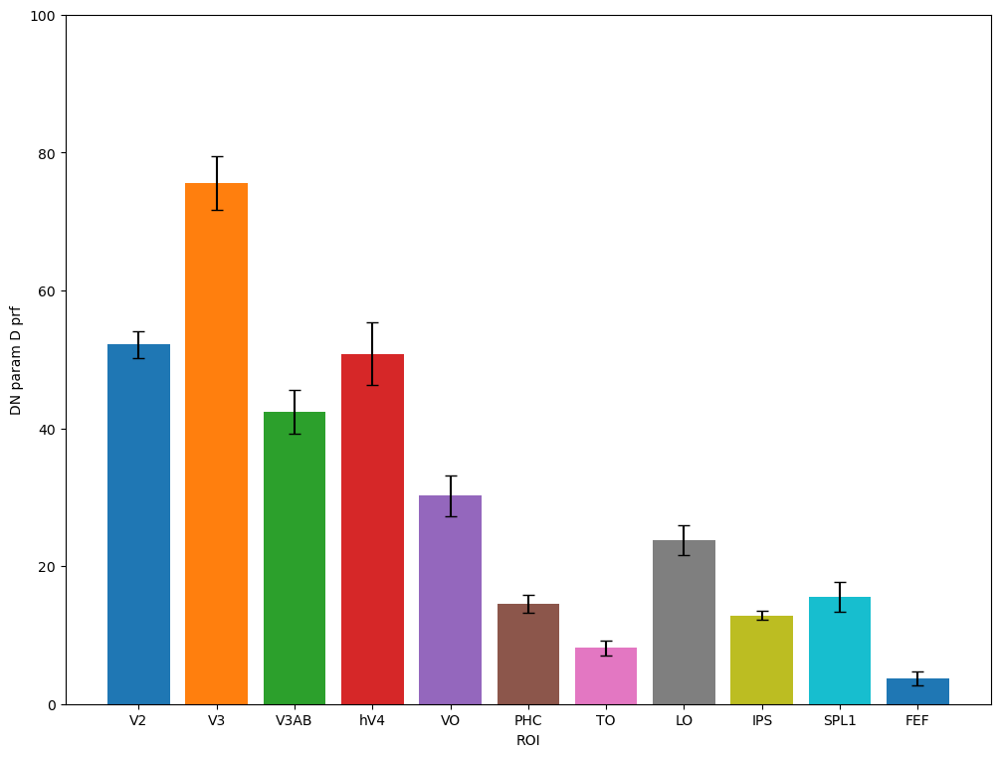

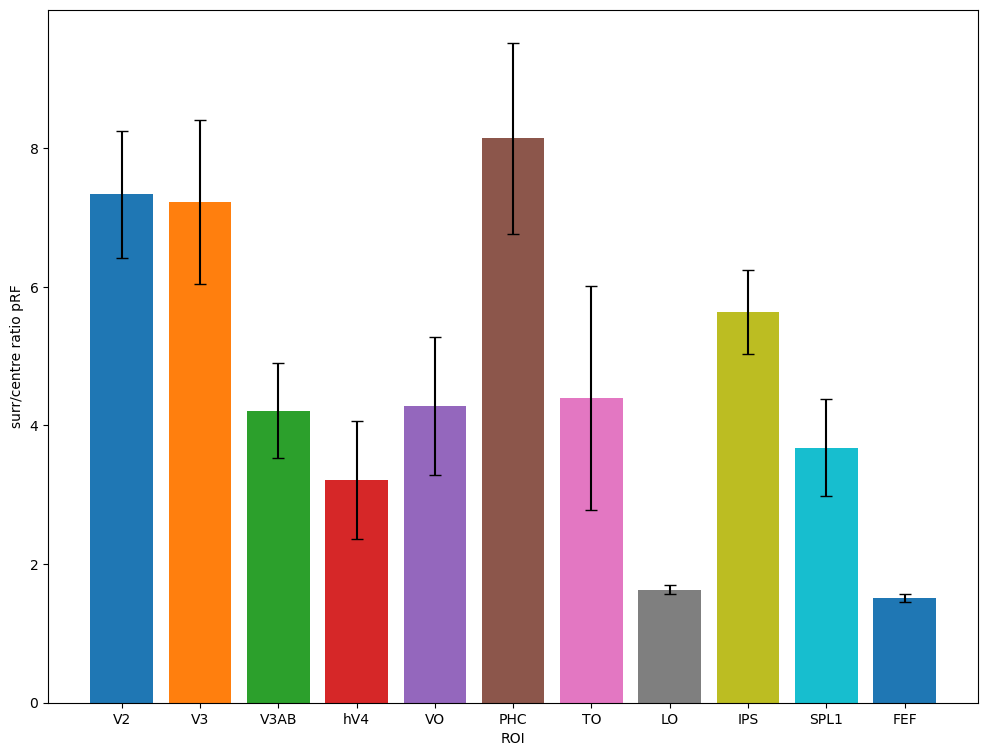

In [168]:
# neural baseline  7 B
# surround baseline 8 D

# plot B param pRF

rsq_mask = dn_prf[:,-1] < 0.15

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.copy(dn_prf[:,7][brainmask])
toplot[rsq_mask] = np.nan


plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))
  
    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('DN param B prf')
plt.xlabel('ROI')
plt.ylim([0,200])

# plot D param pRF

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.copy(dn_prf[:,8][brainmask])
toplot[rsq_mask] = np.nan

plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))

    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('DN param D prf')
plt.xlabel('ROI')
plt.ylim([0, 100])

# surr ratio

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.copy((dn_prf[:,6]/dn_prf[:,2])[brainmask])
toplot[rsq_mask] = np.nan

plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))

    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('surr/centre ratio pRF')
plt.xlabel('ROI')
# plt.ylim([0, 100])

/tmp/ipykernel_2298842/1285002838.py:52: RuntimeWarning: invalid value encountered in divide
  toplot[brainmask] = np.copy((dncf_cortical[:,5]/dncf_cortical[:,0]))


Text(0.5, 0, 'ROI')

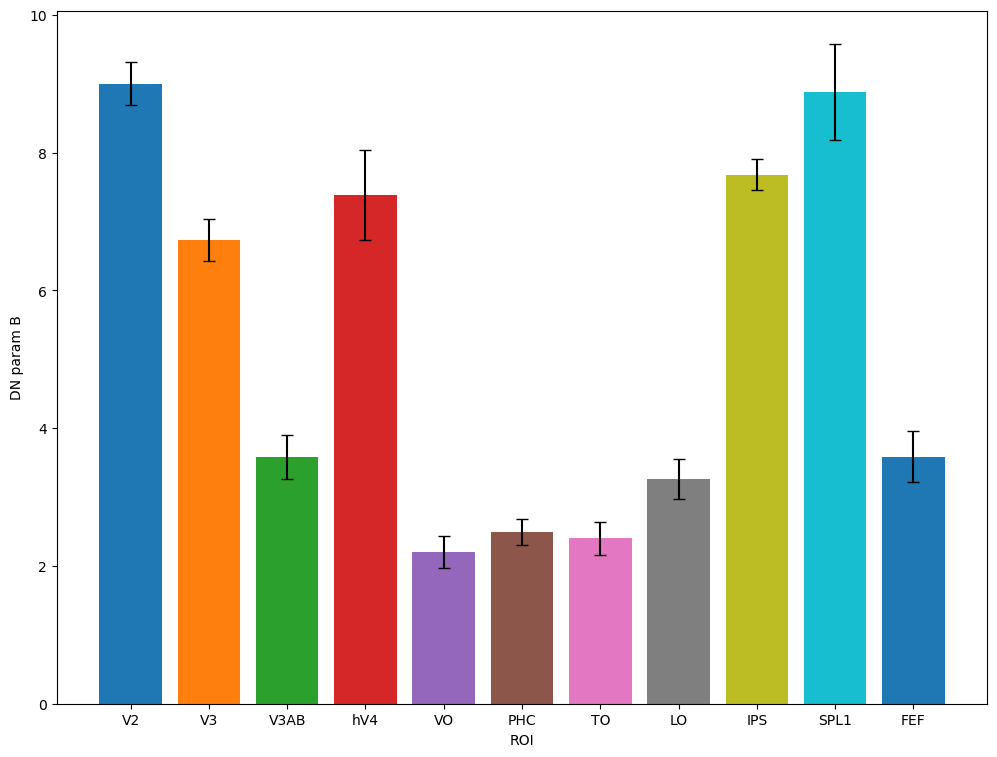

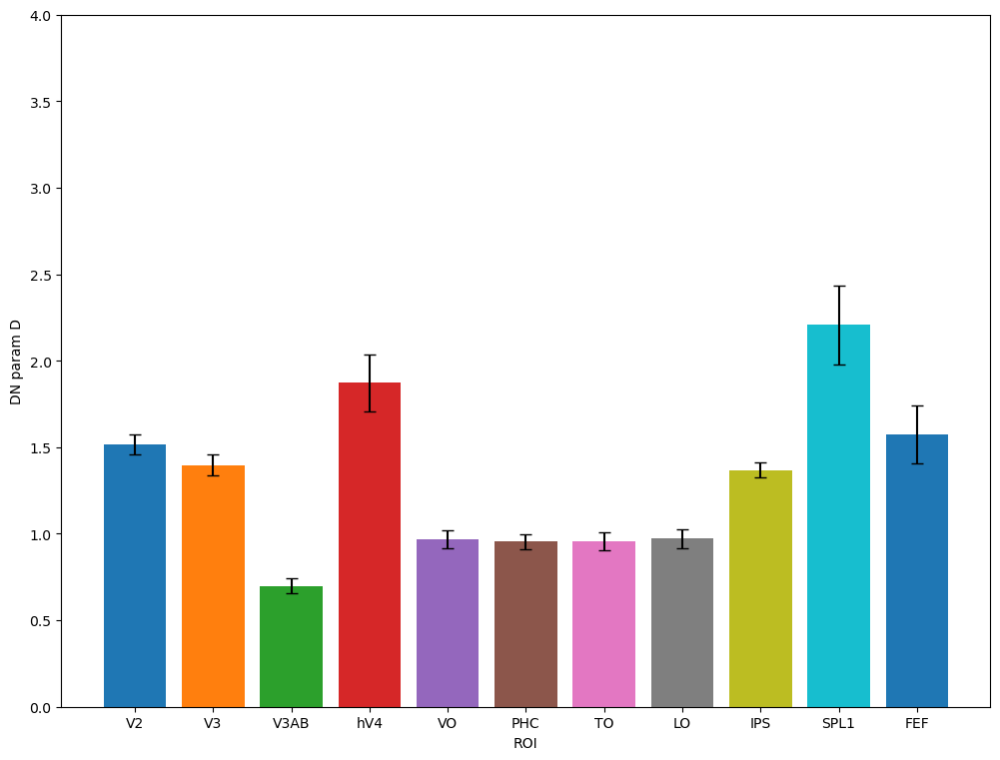

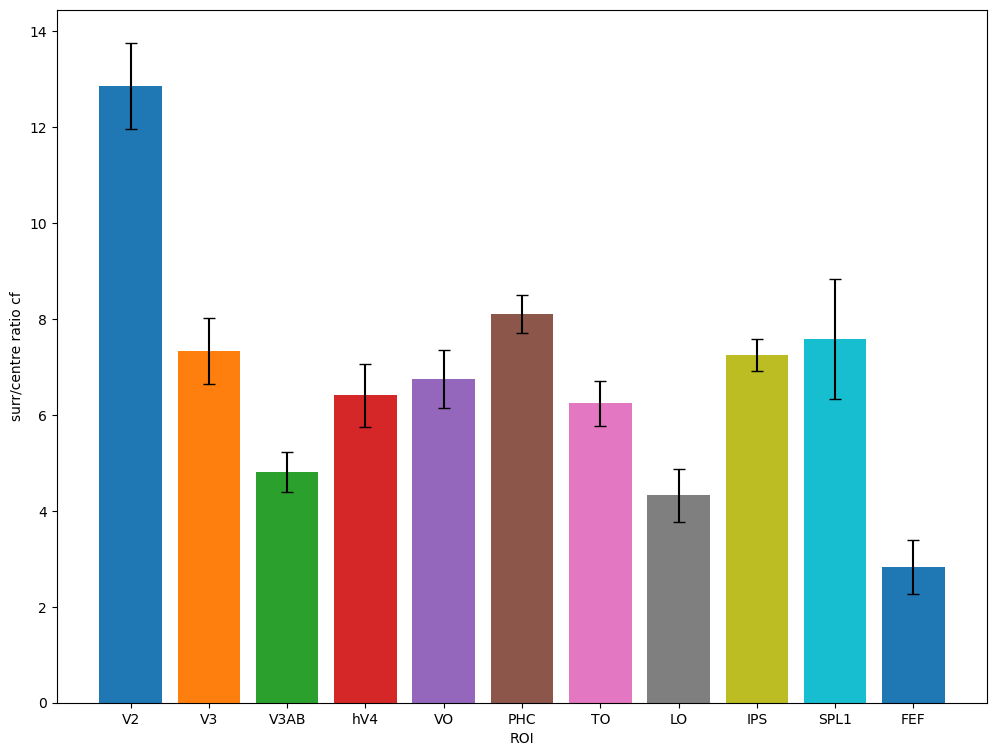

In [176]:

# B param CF

toplot = np.zeros([118584,])
toplot[:] = np.nan

toplot[brainmask] = np.copy(dncf_cortical[:,6])
toplot[rsq_mask] = np.nan

plt.figure(figsize=(12, 9))

for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))
  
    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('DN param B')
plt.xlabel('ROI')
# plt.ylim([0,20])


# D param CF
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.copy(dncf_cortical[:,7])
toplot[rsq_mask] = np.nan



plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))

    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('DN param D')
plt.xlabel('ROI')
plt.ylim([0, 4])

# size ratio CF

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[brainmask] = np.copy((dncf_cortical[:,5]/dncf_cortical[:,0]))
toplot[rsq_mask] = np.nan

plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(toplot[boolmask2]))

    plt.bar(l, np.nanmean(toplot[boolmask2]), yerr=error, capsize=4)
    
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:])), list(roi_index_dict2)[1:])
plt.ylabel('surr/centre ratio cf')
plt.xlabel('ROI')

In [45]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan

rdiff[brainmask] = np.copy(dncf_cortical[:,6]) # B
rdiff[rsq_mask] = np.nan

rdiff2 = np.zeros([118584,])
rdiff2[brainmask] = np.copy(dn_prf[:,7])[brainmask] # B
rdiff2[rsq_mask] = np.nan

for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    print(ROI)
    print(scipy.stats.spearmanr(rdiff[boolmask2], rdiff2[boolmask2],nan_policy='omit'))
    # plt.figure(figsize=(12, 9))
    # plt.scatter(rdiff2[boolmask2], rdiff[boolmask2])

V2
SpearmanrResult(correlation=0.1011338517105756, pvalue=0.0009982839815354686)
V3
SpearmanrResult(correlation=0.034430801971163445, pvalue=0.30379002747735034)
V3AB
SpearmanrResult(correlation=0.14465378944336899, pvalue=2.2510118475528548e-05)
hV4
SpearmanrResult(correlation=-0.1462738812398335, pvalue=0.005556227432234994)
VO
SpearmanrResult(correlation=0.12548336745338887, pvalue=0.006565557797710182)
PHC
SpearmanrResult(correlation=-0.03811437698571155, pvalue=0.5568033519740143)
TO
SpearmanrResult(correlation=-0.24508812485836096, pvalue=8.631831164317714e-06)
LO
SpearmanrResult(correlation=0.04081311336975935, pvalue=0.31825794357169507)
IPS
SpearmanrResult(correlation=-0.11107446686701929, pvalue=1.7152615861794017e-07)
SPL1
SpearmanrResult(correlation=0.07591950034698126, pvalue=0.3887672579974564)
FEF
SpearmanrResult(correlation=-0.1361184274704907, pvalue=0.11544527468229508)


In [46]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan

rdiff[brainmask] = np.copy(dncf_cortical[:,7]) # D
rdiff[rsq_mask] = np.nan

rdiff2 = np.zeros([118584,])
rdiff2[brainmask] = np.copy(dn_prf[:,8])[brainmask] # D
rdiff2[rsq_mask] = np.nan

for l, ROI in enumerate(list(roi_index_dict2)[1:]):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    print(ROI)
    print(scipy.stats.spearmanr(rdiff[boolmask2], rdiff2[boolmask2],nan_policy='omit'))
    # plt.figure(figsize=(12, 9))
    # plt.scatter(rdiff2[boolmask2], rdiff[boolmask2])

V2
SpearmanrResult(correlation=0.027240974085078157, pvalue=0.3765113182560217)
V3
SpearmanrResult(correlation=-0.06436207475747677, pvalue=0.05438998568757169)
V3AB
SpearmanrResult(correlation=0.004002474780658333, pvalue=0.9071315964094233)
hV4
SpearmanrResult(correlation=0.049414421936590264, pvalue=0.3511998099233825)
VO
SpearmanrResult(correlation=-0.10321887515150321, pvalue=0.02555148701600738)
PHC
SpearmanrResult(correlation=-0.22312713762391703, pvalue=0.0004965095132906956)
TO
SpearmanrResult(correlation=-0.13953849894713122, pvalue=0.012194503731497228)
LO
SpearmanrResult(correlation=-0.12671312975869375, pvalue=0.0018715283630343586)
IPS
SpearmanrResult(correlation=0.04188859771323217, pvalue=0.04926603196778306)
SPL1
SpearmanrResult(correlation=0.20674211284898308, pvalue=0.01782423681415962)
FEF
SpearmanrResult(correlation=0.1180957955321432, pvalue=0.17251456777087015)


Text(0.5, 1.0, 'pRF DN')

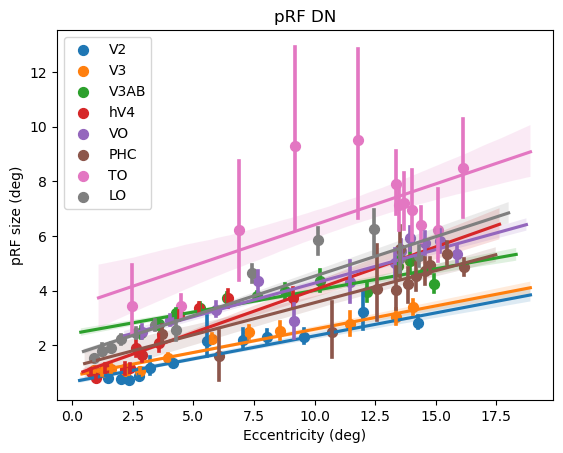

In [170]:
rdiff = np.zeros([118584,12])
rdiff[brainmask] = np.copy(dn_prf[brainmask])

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-1][boolmask2] >= 0.15)
    # print(rsqm.shape)
    ax = sns.regplot(x=ecc(rdiff[:,0], rdiff[:,1])[boolmask2][rsqm], y=rdiff[:,2][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
plt.legend()
ax.set(xlabel='Eccentricity (deg)', ylabel='pRF size (deg)')
plt.title('pRF DN')
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)


In [195]:
biddat = nb.load('/scratch/2021/nprf_ss/addition_to_be_merged/niftis/de_23122016_1631363_5_2_wiprc1senseV4-d0359.nii.gz')
biddat.shape

(112, 112, 51, 359)

In [ ]:
##### sub-01
de_23122016_1631363_5_2_wiprc1senseV4-d0359.nii.gz
sub-01_ses-05_task-rc_run-01_bold


de_23122016_1642405_7_2_wipro2senseV4-d0174.nii.gz
sub-01_ses-05_task-ro_run-01_bold


de_23122016_1654322_10_2_wiprc3senseV4-d0600.nii.gz
sub-01_ses-05_task-rc_run-02_bold


de_23122016_1705320_12_2_wipro4senseV4-d0600.nii.gz

sub-01_ses-05_task-ro_run-02_bold




###### sub-02
tk_23122016_1525262_5_2_wiprc1senseV4-d0600.nii.gz

sub-02_ses-05_task-rc_run-01_bold

tk_23122016_1535361_6_2_wiprc1topupsenseV4-d0005.nii.gz

sub-02_ses-05_run-01_epi

tk_23122016_1536429_7_2_wipro2senseV4-d0600.nii.gz

sub-02_ses-05_task-ro_run-01_bold

tk_23122016_1546522_8_2_wipro2topupsenseV4-d0005.nii.gz

sub-02_ses-05_run-02_epi

tk_23122016_1548575_10_2_wiprc3senseV4-d0600.nii.gz

sub-02_ses-05_task-rc_run-02_bold

tk_23122016_1559016_11_2_wiprc3topupsenseV4-d0005.nii.gz

sub-02_ses-05_run-03_epi

tk_23122016_1601586_12_2_wipro4senseV4-d0600.nii.gz

sub-02_ses-05_task-ro_run-02_bold

tk_23122016_1612038_13_2_wipro4topupsenseV4-d0005.nii.gz

sub-02_ses-05_run-04_epi



sub-02_ses-02_run-01_epi.json






Text(0.5, 1.0, 'CF DN sub-02')

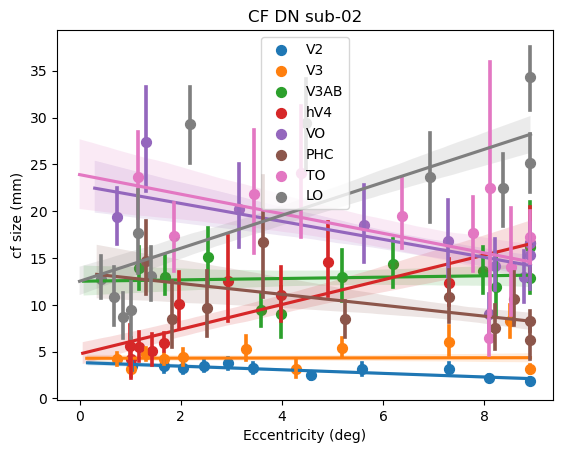

In [177]:
rdiff = np.zeros([118584,11])
rdiff[brainmask] = np.copy(dncf_cortical)
# rdiff[rsq_mask] = np.nan

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-3][boolmask2] >= 0.15)
    # print(rsqm.shape)
    ax = sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[boolmask2][rsqm], y=rdiff[:,0][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
plt.legend()
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)
ax.set(xlabel='Eccentricity (deg)', ylabel='cf size (mm)')
plt.title(f'CF DN sub-0{sub}')


In [213]:
# plt.scatter(dncf_cortical[:,7], dn_prf[:,8][brainmask])

In [193]:
roi_index_dict2 = {
    'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'hV4':  7, 'VO1':  8, 'VO2':  9, 'PHC1':  10, 'PHC2':  11,
    'TO2':  12, 'TO1':  13, 'LO2':  14, 'LO1':  15, 'V3B':  16, 'V3A':  17, 'IPS0':  18, 'IPS1':  19, 'IPS2':  20, 'IPS3':  21, 'IPS4': 22,
    'IPS5':  23, 'SPL1':  24, 'FEF': 25}

# roi_index_dict2 = {
#     'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'V3AB':  [16, 17], 'hV4':  7, 'VO':  [8, 9], 'PHC':  [10, 11],
#     'TO':  [12, 13], 'LO':  [14, 15], 'IPS':  [18, 19, 20, 21, 22, 23], 'SPL1':  24, 'FEF': 25}

(array([ 810.,  524.,  382.,  419.,  445.,  535.,  433.,  501.,  621.,
        1016.,  441.,  137.,   92.,   90.,   79.,   61.,   50.,   51.,
          55.,   44.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
        1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ]),
 <BarContainer object of 20 artists>)

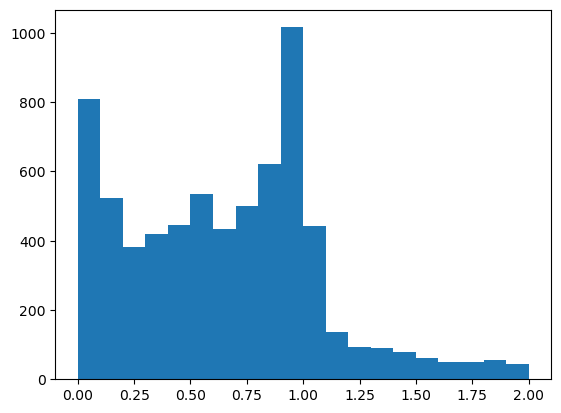

In [260]:
plt.hist(dncf_cortical[:,7], bins=20, range=[0,2])

V2
1059
V3
899
hV4
358
VO1
203
VO2
265
PHC1
170
PHC2
74
TO2
61
TO1
262
LO2
235
LO1
365
V3B
313
V3A
544
IPS0
655
IPS1
539
IPS2
403
IPS3
492
IPS4
102
IPS5
20
SPL1
142
FEF
135


(0.0, 2.4)

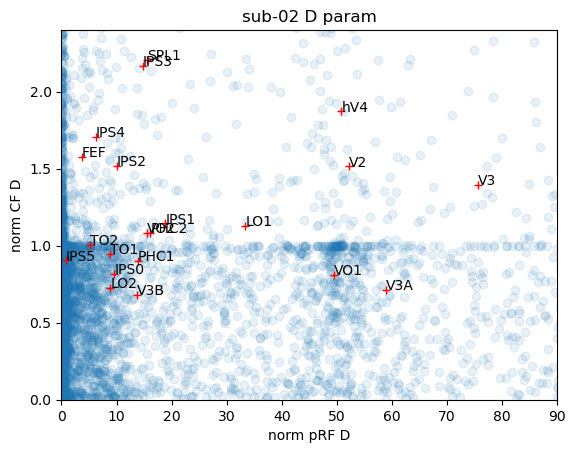

In [249]:
means_prf_d = []
means_cf_d = []
error_prf = []
error_cf = []

rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

plt.figure()
for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (dn_prf[:,-1][boolmask2] >= 0.15)
    print(ROI)
    print(rsqm.sum())
    # plt.plot(np.nanmean(rdiff[:,6][boolmask2][rsqm]), np.nanmean(dn_prf[:,7][boolmask2][rsqm], 'r+'))
    # plt.text(np.nanmean(rdiff[:,6][boolmask2][rsqm]), np.nanmean(dn_prf[:,7][boolmask2][rsqm]), 'lol')
             
    means_cf_d.append(np.nanmean(rdiff[:,7][boolmask2][rsqm]))
    means_prf_d.append(np.nanmean(dn_prf[:,8][boolmask2][rsqm]))
    error_cf.append(sem(np.nan_to_num(rdiff[:,7][boolmask2][rsqm])))
    error_prf.append(sem(np.nan_to_num(dn_prf[:,8][boolmask2][rsqm])))


plt.plot(means_prf_d, means_cf_d, 'r+')
plt.ylabel('norm CF D')
plt.xlabel('norm pRF D')
plt.title(f'sub-0{sub} D param')
for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    plt.annotate(ROI, (means_prf_d[l], means_cf_d[l]))

    
msk1 = dn_prf[:,-1][brainmask] > 0.3
msk2 = dncf_cortical[:,-3] > 0.3
combmask = msk1 + msk2

plt.scatter(dn_prf[:,8][brainmask][combmask], dncf_cortical[:,7][combmask], alpha=0.1)# y = [2.56422, 3.77284, 3.52623, 3.51468, 3.02199]

plt.xlim([0, 90])
plt.ylim([0, 2.4])



V2
(1059,)
0.7737231968550308
V3
(899,)
0.7718681711256234
hV4
(358,)
0.8380722969853419
VO1
(203,)
0.7701241686335082
VO2
(265,)
0.5161518215712301
PHC1
(170,)
0.4098196295639135
PHC2
(74,)
0.2396809031702524
TO2
(61,)
-0.23691440595994828
TO1
(262,)
0.41617714980622644
LO2
(235,)
0.4736287800081428
LO1
(365,)
0.678157930921804
V3B
(313,)
0.6458394829185111
V3A
(544,)
0.6774136919355094
IPS0
(655,)
0.42439509045376717
IPS1
(539,)
0.4011574941542765
IPS2
(403,)
0.10627081781752658
IPS3
(492,)
0.14147040479487272
IPS4
(102,)
0.23331119520215646
IPS5
(20,)
0.225706816978218
SPL1
(142,)
-0.09881215533728767
FEF
(135,)
-0.13246714325668116


(0.0, 9.0)

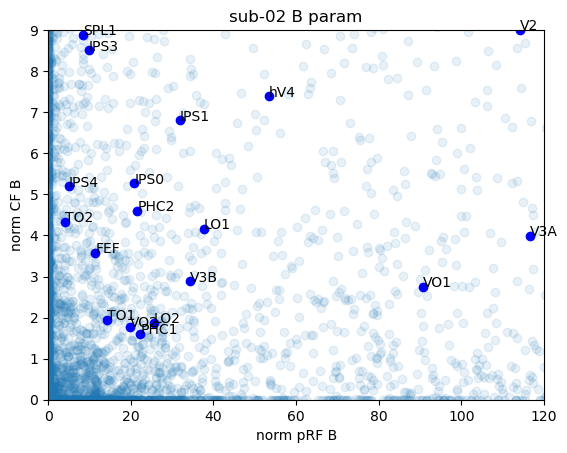

In [248]:
means_prf_b = []
means_cf_b = []
error_prf = []
error_cf = []

rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

plt.figure()
for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    print(ROI)
    rsqm = (dn_prf[:,-1][boolmask2] >= 0.15)
    # print(rsqm.shape)
    # plt.plot(np.nanmean(rdiff[:,6][boolmask2][rsqm]), np.nanmean(dn_prf[:,7][boolmask2][rsqm], 'r+'))
    # plt.text(np.nanmean(rdiff[:,6][boolmask2][rsqm]), np.nanmean(dn_prf[:,7][boolmask2][rsqm]), 'lol')
             
             
    print(rdiff[:,6][boolmask2][rsqm].shape)
    print(np.nanmean(rdiff[:,-3][boolmask2][rsqm]))
    means_cf_b.append(np.nanmean(rdiff[:,6][boolmask2][rsqm]))
    means_prf_b.append(np.nanmean(dn_prf[:,7][boolmask2][rsqm]))
    error_cf.append(sem(np.nan_to_num(rdiff[:,6][boolmask2][rsqm])))
    error_prf.append(sem(np.nan_to_num(dn_prf[:,7][boolmask2][rsqm])))


plt.plot(means_prf_b, means_cf_b, 'bo')
plt.ylabel('norm CF B')
plt.xlabel('norm pRF B')
plt.title(f'sub-0{sub} B param')
for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    plt.annotate(ROI, (means_prf_b[l], means_cf_b[l]))

    
    
    
msk1 = dn_prf[:,-1][brainmask] > 0.3
msk2 = dncf_cortical[:,-3] > 0.3
combmask = msk1 + msk2

plt.scatter(dn_prf[:,7][brainmask][combmask], dncf_cortical[:,6][combmask], alpha=0.1)
plt.xlim([0, 120])
plt.ylim([0, 9])


[Text(0.5, 0, 'B param pRF'), Text(0, 0.5, 'B param CF')]

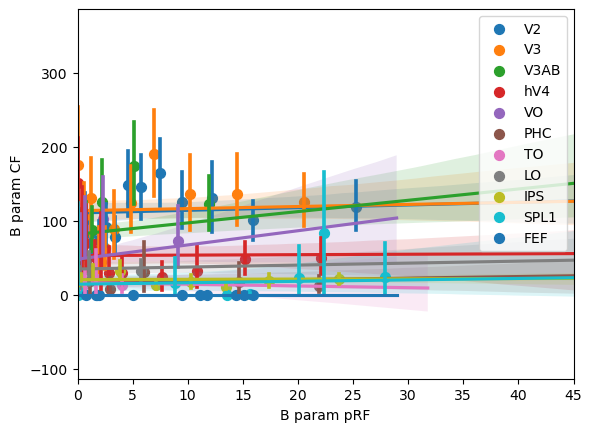

In [47]:
rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-3][boolmask2] >= 0.15)
    # print(rsqm.shape)
    ax = sns.regplot(x=rdiff[:,6][boolmask2][rsqm], y=dn_prf[:,7][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
    plt.xlim([0, 45])

plt.legend()
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)
ax.set(xlabel='B param pRF', ylabel='B param CF')

[Text(0.5, 0, 'D param pRF'), Text(0, 0.5, 'D param CF')]

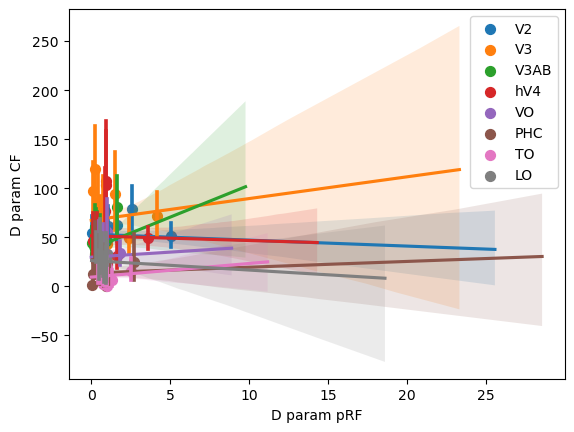

In [34]:
rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-3][boolmask2] >= 0.15)
    # print(rsqm.shape)
    ax = sns.regplot(x=rdiff[:,7][boolmask2][rsqm], y=dn_prf[:,8][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
    # plt.xlim([0, 20])

plt.legend()
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)
ax.set(xlabel='D param pRF', ylabel='D param CF')

In [ ]:
rdiff = np.zeros([118584,12])
rdiff[brainmask] = np.copy(dn_prf[brainmask])

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-1][boolmask2] >= 0.15)
    print(rsqm.shape)
    ax = sns.regplot(x=ecc(rdiff[:,0], rdiff[:,1])[boolmask2][rsqm], y=rdiff[:,2][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
plt.legend()
ax.set(xlabel='Eccentricity (deg)', ylabel='pRF size (deg)')
plt.title('pRF DN')
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)


In [ ]:
import seaborn as sns
rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    # plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    rsqm = (rdiff[:,-3][boolmask2] >= 0.15)
    print(rsqm.shape)
    ax = sns.regplot(x=rdiff[:,7][boolmask2][rsqm], y=dn_prf[:,8][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
    # plt.xlim([0, 45])

plt.legend()
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)
ax.set(xlabel='D param pRF', ylabel='D param CF')

(1286,)
(983,)
(871,)
(358,)
(488,)
(483,)
(334,)
(600,)


[Text(0.5, 0, 'B param pRF'), Text(0, 0.5, 'B param CF')]

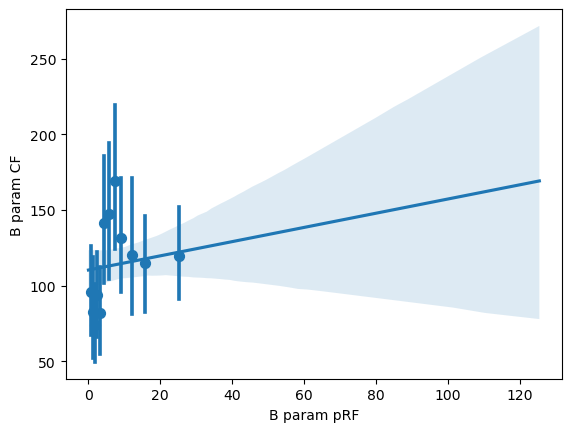

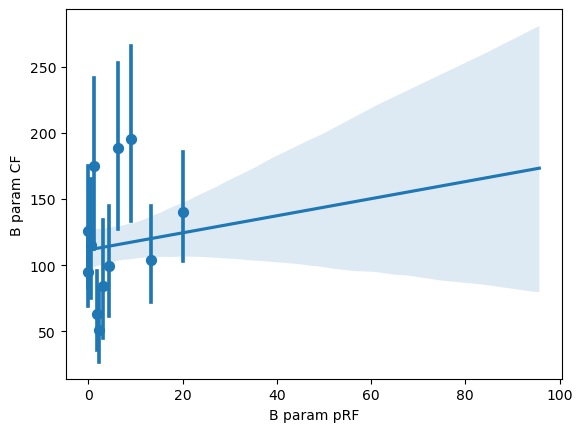

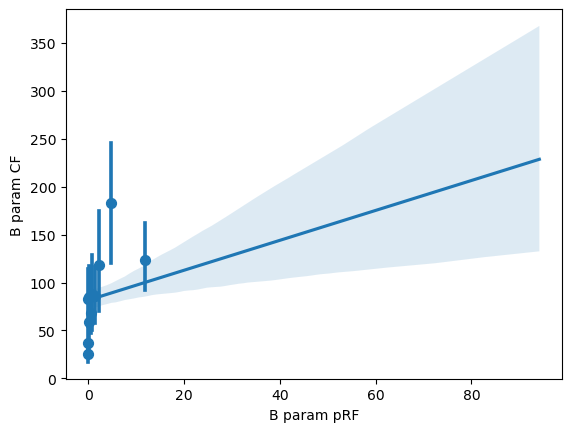

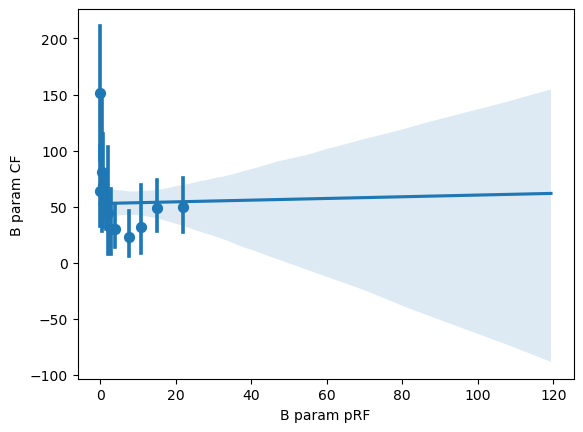

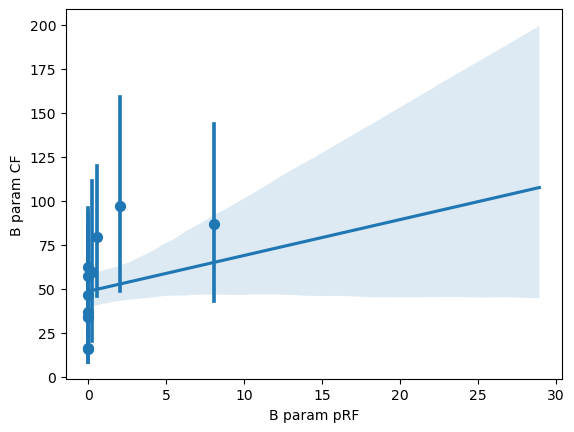

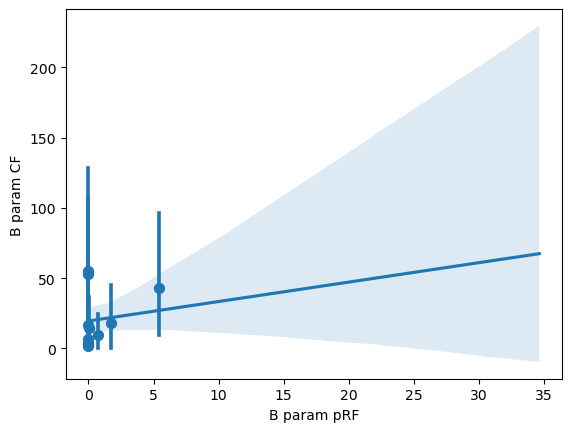

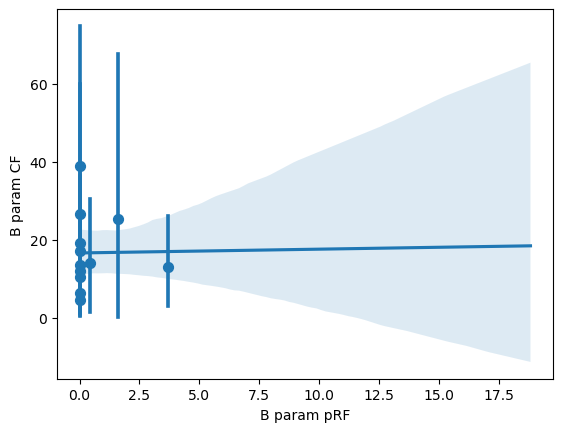

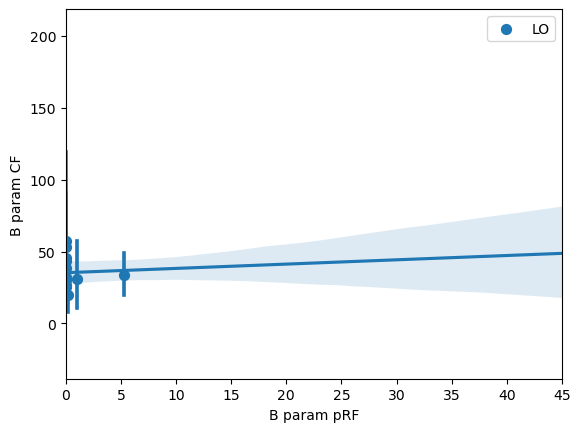

In [111]:
import seaborn as sns
rdiff = np.zeros([118584,11])
rdiff[brainmask] = dncf_cortical

for l, ROI in enumerate(list(roi_index_dict2)[1:-3]):
    plt.figure()
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    # rsqm = (rdiff[:,-3][boolmask2] >= 0.15)
    rsqm = dn_prf[:,-1][boolmask2] >= 0.15
    print(rsqm.shape)
    ax.set(xlabel='B param pRF', ylabel='B param CF')
    ax = sns.regplot(x=rdiff[:,6][boolmask2][rsqm], y=dn_prf[:,7][boolmask2][rsqm], x_estimator=np.mean, x_bins = 12, label=f'{ROI}')
plt.legend()
plt.xlim([0, 45])
# rsqm = rdiff[:,-3] >= 0.15
# sns.regplot(x=ecc(rdiff[:,-1], rdiff[:,-2])[rsqm], y=rdiff[:,0][rsqm], x_estimator=np.mean, x_bins = 12)
ax.set(xlabel='B param pRF', ylabel='B param CF')

In [42]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan
rdiff[roimsask] = cf_logvis[:,-3]

rdiff2 = np.zeros([118584,])
rdiff2[:] = np.nan
rdiff2[roimask] = dncf_logvis[:,-3]


width = 0.25
cs = 2

# plt.figure(figsize=(12, 6))
for l, ROI in enumerate(list(roi_index_dict2)):
    print(ROI)
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    if l ==0:
        print(np.nanmean(rdiff[boolmask2]))
        # print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])))
        # x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])]
        # tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
        # add_sign_plot_bar2()
        # error = sem(np.nan_to_num(rdiff[boolmask2]))
        # plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, label='Vanilla', color='teal', yerr=error, capsize=cs)
        # error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
        # plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, label='DN', color='coral', yerr=error2, capsize=cs)

    else:
        print(np.nanmean(rdiff[boolmask2]))
        # print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2]))
        # x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])]
        # tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
        # add_sign_plot_bar2()
        # error = sem(np.nan_to_num(rdiff[boolmask2]))
        # plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, color='teal', yerr=error, capsize=cs)
        # error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
        # plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, color='coral', yerr=error2, capsize=cs)


        


V1
0.4300474368683856
V2
0.5914946703282012
V3
0.6088909529518906
hV4
0.5533475101872638
VO1
nan
VO2
nan
PHC1
0.0048249093550610765
PHC2
nan
TO2
nan
TO1
0.38126097918069507
LO2
nan
LO1
nan
V3B
0.3618897879215126
V3A
0.18707669970829638
IPS0
nan
IPS1
0.3292127650094896
IPS2
0.4103703536431785
IPS3
0.24621617321306277
IPS4
0.6262081920973496
IPS5
0.133270120925516
SPL1
nan
FEF
nan


/tmp/ipykernel_3962921/1962646707.py:29: RuntimeWarning: Mean of empty slice
  print(np.nanmean(rdiff[boolmask2]))


In [85]:
# roi_index_dict2 = {
#     'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'hV4':  7, 'VO1':  8, 'VO2':  9, 'PHC1':  10, 'PHC2':  11,
#     'TO2':  12, 'TO1':  13, 'LO2':  14, 'LO1':  15, 'V3B':  16, 'V3A':  17, 'IPS0':  18, 'IPS1':  19, 'IPS2':  20, 'IPS3':  21, 'IPS4': 22,
#     'IPS5':  23, 'SPL1':  24, 'FEF': 25}

roi_index_dict2 = {
    'V1':  [1,  2], 'V2':  [3, 4], 'V3':  [5, 6], 'V3AB':  [16, 17], 'hV4':  7, 'VO':  [8, 9], 'PHC':  [10, 11],
    'TO':  [12, 13], 'LO':  [14, 15], 'IPS':  [18, 19, 20, 21, 22, 23], 'SPL1':  24, 'FEF': 25}

V2
F_onewayResult(statistic=37.932631454722646, pvalue=8.472912594579218e-10)
V3
F_onewayResult(statistic=nan, pvalue=nan)
hV4
F_onewayResult(statistic=4.462801195019194, pvalue=0.03498721319241086)
VO1
F_onewayResult(statistic=8.364929425708278, pvalue=0.004032139564417697)
VO2
F_onewayResult(statistic=nan, pvalue=nan)
PHC1
F_onewayResult(statistic=nan, pvalue=nan)
PHC2
F_onewayResult(statistic=nan, pvalue=nan)
TO2
F_onewayResult(statistic=nan, pvalue=nan)
TO1
F_onewayResult(statistic=nan, pvalue=nan)
LO2
F_onewayResult(statistic=1.8080394913526563, pvalue=0.17939490929526775)
LO1
F_onewayResult(statistic=1.907671467059628, pvalue=0.16764593786770648)
V3B
F_onewayResult(statistic=nan, pvalue=nan)
V3A
F_onewayResult(statistic=nan, pvalue=nan)
IPS0
F_onewayResult(statistic=nan, pvalue=nan)
IPS1
F_onewayResult(statistic=nan, pvalue=nan)
IPS2
F_onewayResult(statistic=nan, pvalue=nan)
IPS3
F_onewayResult(statistic=nan, pvalue=nan)
IPS4
F_onewayResult(statistic=1.3779989301943039, pvalue=0.

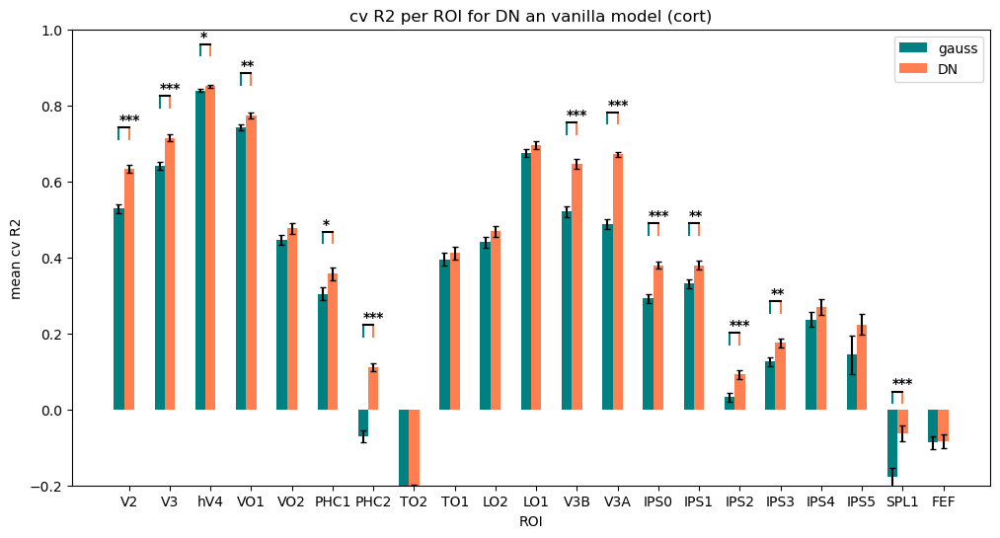

In [84]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan
rdiff[brainmask] = cf_cortical[:,-3]

rdiff2 = np.zeros([118584,])
rdiff2[:] = np.nan
rdiff2[brainmask] = dncf_cortical[:,-3]


width = 0.25
cs = 2

plt.figure(figsize=(12, 6))
for l, ROI in enumerate(list(roi_index_dict2)[1:]):
    print(ROI)
    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    if l ==0:
        print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])))
        x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])]
        tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
        add_sign_plot_bar2()
        error = sem(np.nan_to_num(rdiff[boolmask2]))
        plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, label='gauss', color='teal', yerr=error, capsize=cs)
        error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
        plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, label='DN', color='coral', yerr=error2, capsize=cs)

    else:
        print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2]))
        x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2])]
        tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
        add_sign_plot_bar2()
        error = sem(np.nan_to_num(rdiff[boolmask2]))
        plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, color='teal', yerr=error, capsize=cs)
        error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
        plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, color='coral', yerr=error2, capsize=cs)

    plt.title(f'cv R2 per ROI for DN an vanilla model (cort)')
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2)[1:]))+0.25, list(roi_index_dict2)[1:])
plt.ylabel('mean cv R2')
plt.ylim([-0.2, 1])
plt.xlabel('ROI')
plt.legend()

# plt.savefig('/tank/klundert/DN.png')

In [46]:
# rdiff = np.zeros([118584,])
# rdiff[:] = np.nan
# rdiff[boolmask] = dncf_cortical[:,-3]

# rdiff2 = np.zeros([118584,])
# rdiff2[:] = np.nan
# rdiff2[boolmask] = dncf_vis[:,-3]

# rdiff3 = np.zeros([118584,])
# rdiff3[:] = np.nan
# rdiff3[boolmask] = dncf_logvis[:,-3]

# rdiff4 = np.zeros([118584,])
# rdiff4[:] = np.nan
# rdiff4[boolmask] = cf_cortical[:,-3]


# width = 0.25
# cs = 2


# plt.figure(figsize=(12, 6))
# for l, ROI in enumerate(list(roi_index_dict2)[12:]):
#     print(ROI)
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#     if l ==0:
#         print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         add_sign_plot_bar()
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, label='cortical DN', color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, label='visual DN', color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, label='logvisual DN', color='cornflowerblue', yerr=error3, capsize=cs)

#     else:
#         print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2],rdiff3[boolmask2]))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         add_sign_plot_bar()
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, color='cornflowerblue', yerr=error3, capsize=cs)
        
#     plt.title(f'cv R2 per ROI for each model space DN')
#     plt.show
    
# plt.xticks(np.arange(len(list(roi_index_dict2)[12:]))+0.25, list(roi_index_dict2)[12:])
# plt.ylabel('mean cv R2')
# plt.ylim([0, 1])
# plt.xlabel('ROI')
# plt.legend()

In [47]:
# rdiff = np.zeros([118584,])
# rdiff[:] = np.nan
# rdiff[boolmask] = dncf_cortical[:,-3]

# rdiff2 = np.zeros([118584,])
# rdiff2[:] = np.nan
# rdiff2[boolmask] = dncf_vis[:,-3]

# rdiff3 = np.zeros([118584,])
# rdiff3[:] = np.nan
# rdiff3[boolmask] = dncf_logvis[:,-3]

# rdiff4 = np.zeros([118584,])
# rdiff4[:] = np.nan
# rdiff4[boolmask] = cf_cortical[:,-3]


# width = 0.20
# cs = 2


# plt.figure(figsize=(12, 6))
# for l, ROI in enumerate(list(roi_index_dict2)[12:]):
#     print(ROI)
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#     if l ==0:
#         print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         add_sign_plot_bar()
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, label='cortical DN', color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, label='visual DN', color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, label='logvisual DN', color='cornflowerblue', yerr=error3, capsize=cs)

#     else:
#         print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2],rdiff3[boolmask2]))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         add_sign_plot_bar()
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, color='cornflowerblue', yerr=error3, capsize=cs)



# for l, ROI in enumerate(list(roi_index_dict2)[12:]):
#     print(ROI)
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#     if l ==0:

#         error = sem(np.nan_to_num(rdiff4[boolmask2]))
#         plt.bar(l-0.17, np.nanmean(rdiff4[boolmask2]), width = width, label='Vanilla', edgecolor='black',color='y', yerr=error, capsize=cs)

#     else:
#         error = sem(np.nan_to_num(rdiff4[boolmask2]))
#         plt.bar(l-0.17, np.nanmean(rdiff4[boolmask2]), width = width, edgecolor='black', color='y', yerr=error, capsize=cs)


#     plt.title(f'cv R2 per ROI for each model space DN + Vanilla')
#     plt.show
    
# plt.xticks(np.arange(len(list(roi_index_dict2)[12:]))+0.25, list(roi_index_dict2)[12:])
# plt.ylabel('mean cv R2')
# plt.ylim([0, 1])
# plt.xlabel('ROI')
# plt.legend()
# plt.savefig('/tank/klundert/DN_spaces.png')

In [49]:
# from matplotlib.pyplot import rcParams
# import seaborn as sns

# rdiff = np.zeros([118584,])
# rdiff[:] = np.nan
# rdiff[boolmask] = cf_cortical[:,-3]

# rdiff2 = np.zeros([118584,])
# rdiff2[:] = np.nan
# rdiff2[boolmask] = cf_vis[:,-3]

# rdiff3 = np.zeros([118584,])
# rdiff3[:] = np.nan
# rdiff3[boolmask] = cf_logvis[:,-3]


# for l, ROI in enumerate(list(roi_index_dict2)[12:]):
#     if l == 0:
#         boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#         df = pd.DataFrame(rdiff[boolmask2])
#         df['ROI'] = f'{ROI}'
#         df['model'] = 'cortical'
        
#         df2 = pd.DataFrame(rdiff2[boolmask2])
#         df2['ROI'] = f'{ROI}'
#         df2['model'] = 'visual'
        
#         df3 = pd.DataFrame(rdiff3[boolmask2])
#         df3['ROI'] = f'{ROI}'
#         df3['model'] = 'logvisual'
        
#         df = df.append(df2, ignore_index=True)
#         df = df.append(df3, ignore_index=True)
        
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#     df2 = pd.DataFrame(rdiff[boolmask2])
#     df2['ROI'] = f'{ROI}'
#     df2['model'] = 'cortical'
#     df = df.append(df2, ignore_index=True)
    
#     df2 = pd.DataFrame(rdiff2[boolmask2])
#     df2['ROI'] = f'{ROI}'
#     df2['model'] = 'visual'
#     df = df.append(df2, ignore_index=True)
    
#     df2 = pd.DataFrame(rdiff3[boolmask2])
#     df2['ROI'] = f'{ROI}'
#     df2['model'] = 'logvisual'
#     df = df.append(df2, ignore_index=True)
    

    
# df.columns =['Rsq', 'ROI', 'model']    

# rcParams['figure.figsize'] = 20,8

# # Draw a nested violinplot and split the violins for easier comparison
# violin = sns.violinplot(data=df, x="ROI", y='Rsq', hue="model", legend=False, cut=0, palette=["teal", "coral", "cornflowerblue"],
#                inner="quart", linewidth=1).set(title=f'cv R2 for all spaces')

# plt.ylim(-0.5,1.5)
# # plt.legend().remove()
# sns.despine(left=True)
# # ax = sns.violinplot(x="day", y="total_bill", hue="smoker",
# #                     data=tips, palette="muted")


# for l, ROI in enumerate(list(roi_index_dict2)[12:]):
#     print(ROI)
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict2[ROI])
#     if l ==0:
# #         print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         print(tt)
#         l = l-0.25
#         add_sign_plot_violin()

#     else:
#         l = l-0.25
#         print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2],rdiff3[boolmask2]))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         tt = sp.posthoc_ttest(x, p_adjust = 'fdr_bh')
#         print(tt)
#         add_sign_plot_violin()



In [50]:
# test1 = np.zeros([118584,])
# test1[:] = np.nan
# test1[boolmask] = cf_logvis[:,-3]

# test2 = np.zeros([118584,])
# test2[:] = np.nan
# test2[boolmask] = cf_vis[:,-3]

# test3 = np.zeros([118584,])
# test3[:] = np.nan
# test3[boolmask] = cf_cortical[:,-3]

# test1_scaled = np.asarray((test1 > test2) * (test1 > test3) * -1)
# test2_scaled = np.asarray((test2 > test1) * (test2 > test3) * 0)
# test3_scaled = np.asarray((test3 > test2) * (test3 > test1) * 1)


# BM = np.zeros([118584,])
# BM[:] = np.nan
# BM[boolmask] = test1_scaled[boolmask] + test2_scaled[boolmask] + test3_scaled[boolmask]


# vol_data = cx.Vertex(BM, subject='hcp_999999', cmap='spectral_r')
# cx.quickshow(vol_data, with_colorbar=True)
# plt.show()

In [76]:
# toplot = np.zeros([118584,])
# toplot[:] = np.nan
# toplot[boolmask] = dncf_cortical[:,-3] - cf_cortical[:,-3]
# bl = get_blend(cx.Vertex(toplot, subject='hcp_999999', cmap='spectral_r', vmin=-0.05, vmax=0.05))
# cx.webgl.show(bl, port=8810, recache=True);

(118584,)

In [79]:
# roi_index_dict3 = {
#     'Early_visual': [4, 5, 6],
#     'Ventral_stream': [7, 18, 22, 153, 154, 160, 163],
#     'Dorsal_stream': [3, 13,  16,  17,  19, 152],
#     'MT+_Complex_+Neighboring': [2,  20,  21,  23, 138, 156, 157, 158, 159]
#     }

In [51]:
# rdiff = np.zeros([118584,])
# rdiff[:] = np.nan
# rdiff[boolmask] = dncf_cortical[:,-3]

# rdiff2 = np.zeros([118584,])
# rdiff2[:] = np.nan
# rdiff2[boolmask] = dncf_vis[:,-3] 

# rdiff3 = np.zeros([118584,])
# rdiff3[:] = np.nan
# rdiff3[boolmask] = dncf_logvis[:,-3]


# width = 0.25
# cs = 2

# # rduff = norm_avg[:,-1]-gauss_avg[:,-1]
# # rdiff = CF_vis_zsc[:,-1] - CF_cort_zsc[:,-1]
# plt.figure(figsize=(12, 6))
# for l, ROI in enumerate(list(roi_index_dict3)):
#     print(ROI)
#     boolmask2 = np.isin(atlas_data_both_hemis, roi_index_dict3[ROI])
#     if l ==0:
#         print(f_oneway(np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         print(sp.posthoc_ttest(x, p_adjust = 'fdr_bh'))
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, label='cortical', color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, label='vis', color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, label='logvis', color='cornflowerblue', yerr=error3, capsize=cs)
# #         plt.bar(l+0.45, np.nanmean(rdiff3[boolmask2]), width = 0.15, label='logvis', color='red')
#     else:
#         print(f_oneway(rdiff[boolmask2],rdiff2[boolmask2],rdiff3[boolmask2]))
#         x = [np.nan_to_num(rdiff[boolmask2]),np.nan_to_num(rdiff2[boolmask2]),np.nan_to_num(rdiff3[boolmask2])]
#         print(sp.posthoc_ttest(x, p_adjust = 'fdr_bh'))
#         error = sem(np.nan_to_num(rdiff[boolmask2]))
#         plt.bar(l, np.nanmean(rdiff[boolmask2]), width = width, color='teal', yerr=error, capsize=cs)
#         error2 = sem(np.nan_to_num(rdiff2[boolmask2]))
#         plt.bar(l+width, np.nanmean(rdiff2[boolmask2]), width = width, color='coral', yerr=error2, capsize=cs)
#         error3 = sem(np.nan_to_num(rdiff3[boolmask2]))
#         plt.bar(l+width*2, np.nanmean(rdiff3[boolmask2]), width = width, color='cornflowerblue', yerr=error3, capsize=cs)
# #         plt.bar(l+0.45, np.nanmean(rdiff3[boolmask2]), width = 0.15, color='red')


# #     plt.hist(diff[boolmask2], bins=100, range=[-1,60])
#     plt.title(f'CV R2 per ROI DN models')
#     plt.show
    
# plt.xticks(np.arange(len(list(roi_index_dict3)))+0.25, list(roi_index_dict3))
# plt.ylabel('cv R2 DN models')
# # plt.ylim([0, 0.8])
# plt.xlabel('ROI')
# plt.legend()

/tmp/ipykernel_3962921/3953143253.py:3: RuntimeWarning: invalid value encountered in divide
  rdiff[brainmask] = dncf_cortical[:,5] / dncf_cortical[:,0]


Text(0.5, 0, 'ROI')

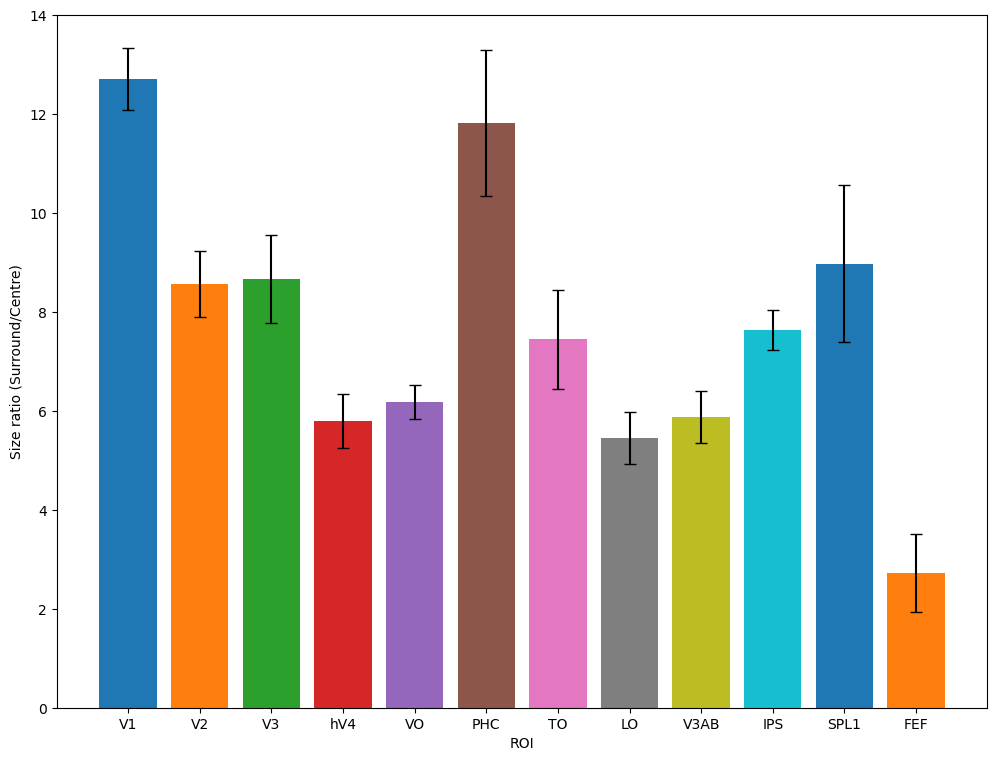

In [123]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan
rdiff[brainmask] = dncf_cortical[:,5] / dncf_cortical[:,0]
# rduff = norm_avg[:,-1]-gauss_avg[:,-1]
# rdiff = CF_vis_zsc[:,-1] - CF_cort_zsc[:,-1]
plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(rdiff[boolmask2]))
    plt.bar(l, np.nanmean(rdiff[boolmask2]), yerr=error, capsize=4)
#     plt.bar(l, np.nanmean(rdiff[boolmask2]))

#     plt.hist(diff[boolmask2], bins=100, range=[-1,60])
#     plt.title(f'Size ratio (Surround/Centre) - DN')
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2))), list(roi_index_dict2))
plt.ylabel('Size ratio (Surround/Centre)')
plt.xlabel('ROI')

(0.0, 2.2)

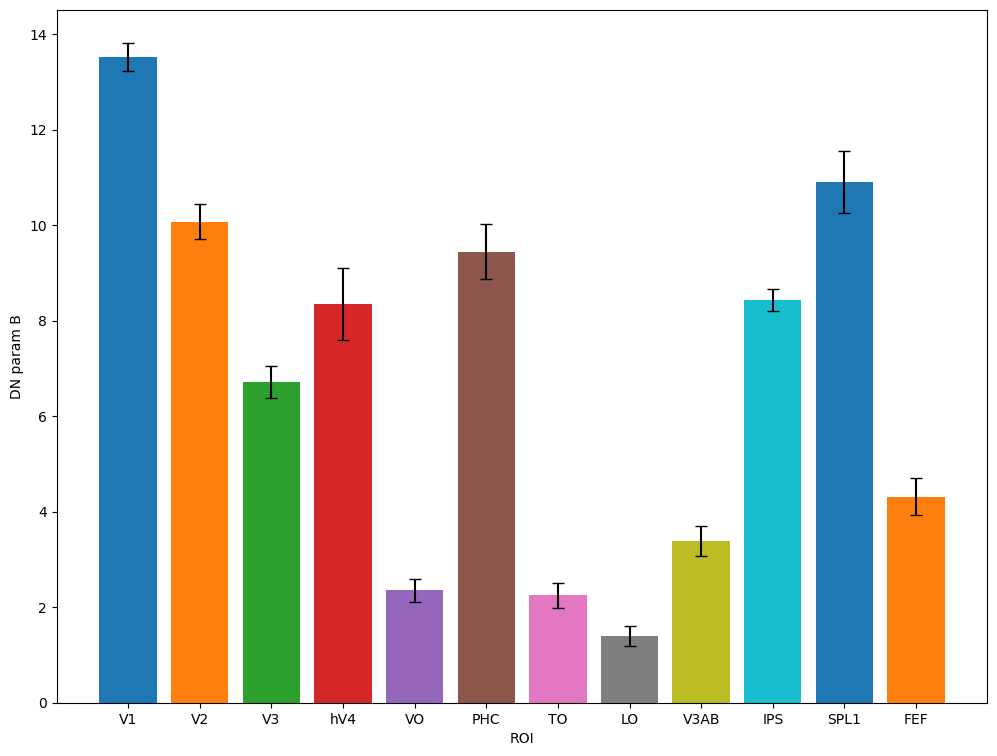

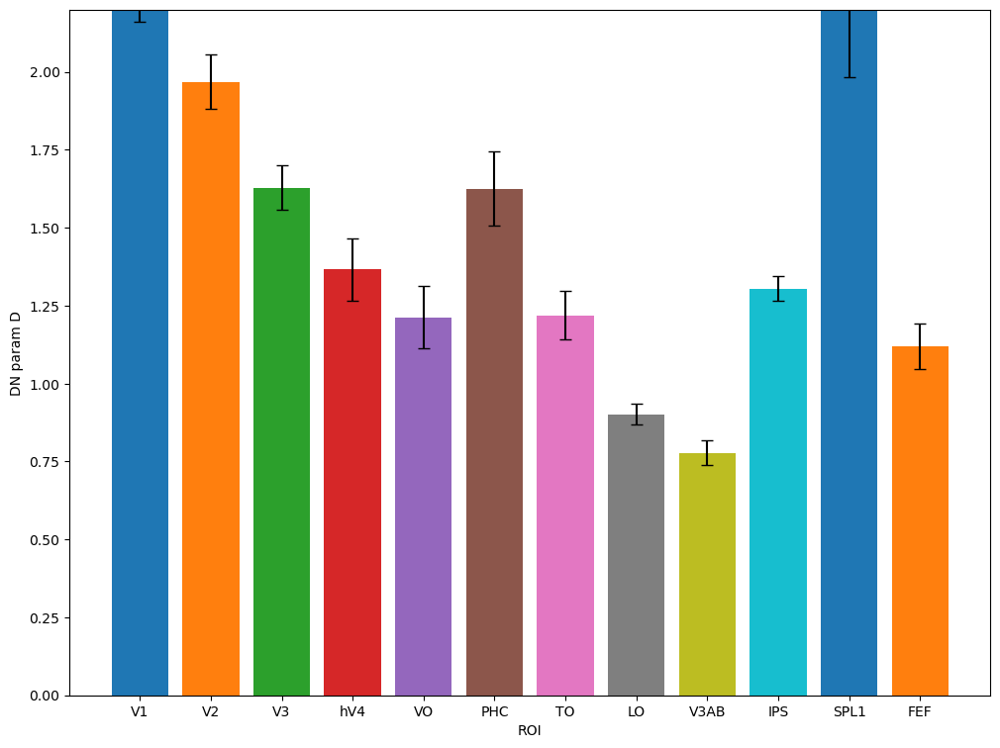

In [128]:
rdiff = np.zeros([118584,])
rdiff[:] = np.nan
rdiff[brainmask] = dncf_cortical[:,6]
# rduff = norm_avg[:,-1]-gauss_avg[:,-1]
# rdiff = CF_vis_zsc[:,-1] - CF_cort_zsc[:,-1]
plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    

#     error = sem(np.nan_to_num(rdiff[boolmask2][(np.abs(stats.zscore(np.nan_to_num(rdiff[boolmask2]))) < 0.1)]))
    error = sem(np.nan_to_num(rdiff[boolmask2]))
  
    plt.bar(l, np.nanmean(rdiff[boolmask2]), yerr=error, capsize=4)
    
    
#     plt.title(f'DN param B - logvisual space')
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2))), list(roi_index_dict2))
plt.ylabel('DN param B')
plt.xlabel('ROI')
# plt.ylim([0,20])

rdiff = np.zeros([118584,])
rdiff[:] = np.nan
rdiff[brainmask] = dncf_cortical[:,7]
# rduff = norm_avg[:,-1]-gauss_avg[:,-1]
# rdiff = CF_vis_zsc[:,-1] - CF_cort_zsc[:,-1]
plt.figure(figsize=(12, 9))
for l, ROI in enumerate(list(roi_index_dict2)):

    boolmask2 = np.isin(atlas_data, roi_index_dict2[ROI])
    error = sem(np.nan_to_num(rdiff[boolmask2]))



    plt.bar(l, np.nanmean(rdiff[boolmask2]), yerr=error, capsize=4)
#     plt.bar(l, np.nanmedian(rdiff[boolmask2]))

#     plt.hist(diff[boolmask2], bins=100, range=[-1,60])
#     plt.title(f'DN param D - logvisual space')
    plt.show
    
plt.xticks(np.arange(len(list(roi_index_dict2))), list(roi_index_dict2))
plt.ylabel('DN param D')
plt.xlabel('ROI')
plt.ylim([0, 2.2])

Text(0.5, 1.0, 'norm (logvis)')

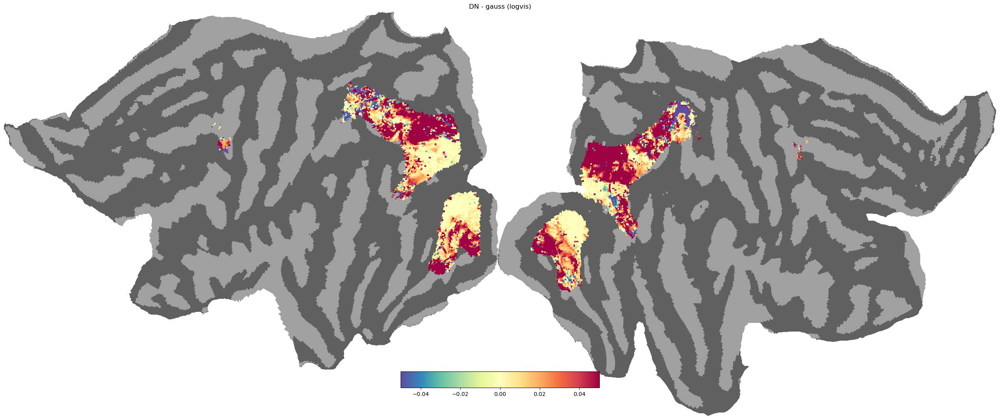

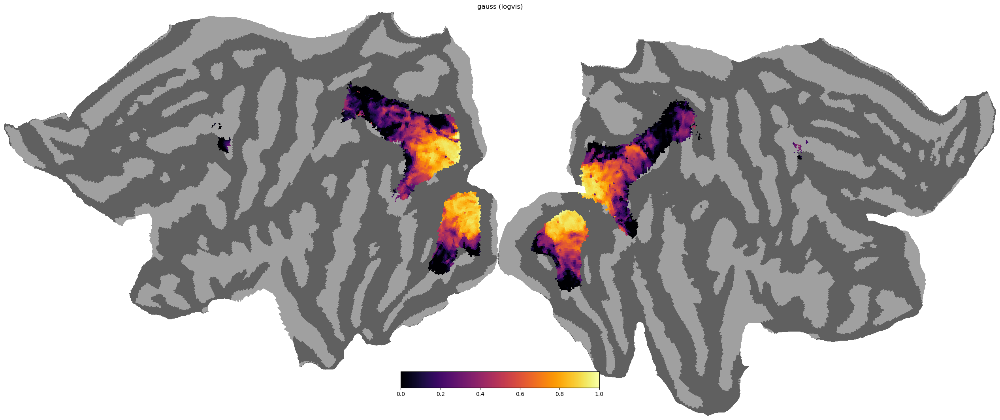

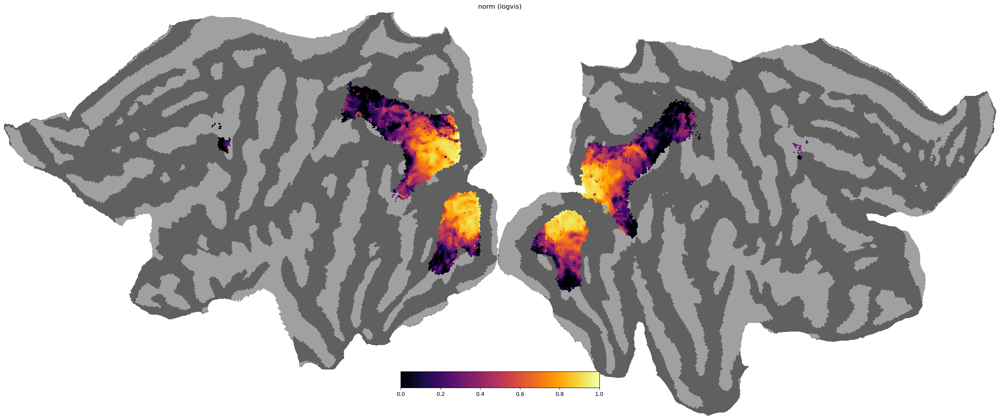

In [48]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[roimask] = dncf_logvis[:,-3] - cf_logvis[:,-3]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='spectral_r', vmin=-0.05, vmax=0.05), with_curvature=True);
plt.title('DN - gauss (logvis)')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[roimask] = cf_logvis[:,-3]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1), with_curvature=True);
plt.title('gauss (logvis)')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[roimask] = dncf_logvis[:,-3]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1), with_curvature=True);
plt.title('norm (logvis)')

In [ ]:
toplot = np.zeros([118584,])
toplot[:] = np.nan

toplot[boolmask] = dncf_vis[:,0]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0, vmax=15), with_curvature=True);
plt.title('DN vis sigma')

toplot = np.zeros([118584,])
toplot[:] = np.nan

toplot[boolmask] = dncf_vis[:,5]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0), with_curvature=True);
plt.title('DN vis sigma2')


toplot = np.zeros([118584,])
toplot[:] = np.nan

toplot[boolmask] = dncf_vis[:,5] / dncf_vis[:,0]
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='inferno', vmin=0), with_curvature=True);
plt.title('DN vis size ratio')


In [ ]:
toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[boolmask] = ecc(cf_vis[:,-1], cf_vis[:,-2])
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='plasma', vmin=0, vmax=10), with_curvature=True);
plt.title('ecc visual space')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[boolmask] = ecc(cf_logvis[:,-1], cf_logvis[:,-2])
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='plasma', vmin=0, vmax=10), with_curvature=True);
plt.title('ecc log-visual space')

toplot = np.zeros([118584,])
toplot[:] = np.nan
toplot[boolmask] = ecc(cf_cortical[:,-1], cf_cortical[:,-2])
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='plasma', vmin=0, vmax=10), with_curvature=True);
plt.title('ecc cortical space')

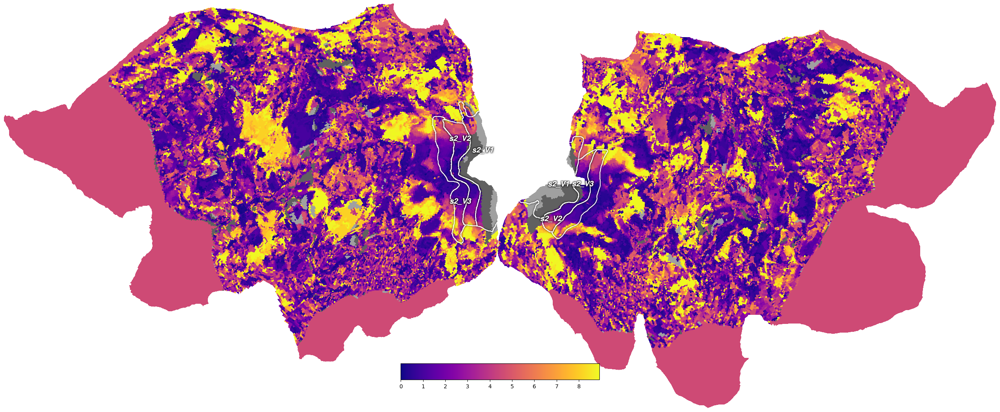

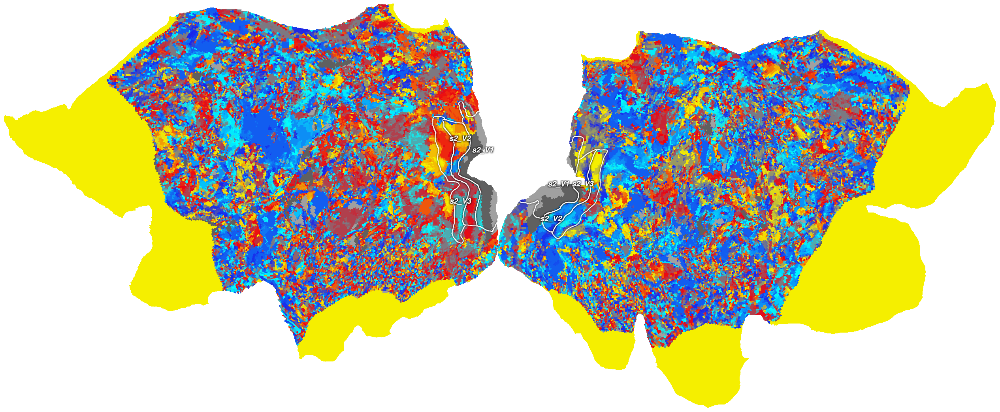

In [222]:
# toplot = np.zeros([118584,])
# toplot[:] = np.nan
# # datass = np.load('/tank/klundert/projects/cfdn/scripts/data_check_100610.npy')
# toplot[boolmask] = angle(cf_vis[:,-1], cf_vis[:,-2]*-1)
# # toplot[boolmask] = difference
# cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=-np.pi, vmax=np.pi));
# # plt.title('polar angle visual space')

# toplot = np.zeros([118584,])
# toplot[:] = np.nan
# # datass = np.load('/tank/klundert/projects/cfdn/scripts/data_check_100610.npy')
# toplot[boolmask] = angle(cf_logvis[:,-1], cf_logvis[:,-2]*-1)
# # toplot[boolmask] = difference
# cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=-np.pi, vmax=np.pi), with_curvature=True, with_colorbar=False);
# # plt.title('polar angle logvisual space')

toplot = np.zeros([118584,])
toplot[:] = np.nan
# datass = np.load('/tank/klundert/projects/cfdn/scripts/data_check_100610.npy')
toplot[brainmask] = ecc(cf_cortical[:,-1], cf_cortical[:,-2]*-1)
# toplot[boolmask] = difference
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='plasma', vmin=0), with_curvature=True, with_colorbar=True);
# plt.title('polar angle cortical space')

toplot = np.zeros([118584,])
toplot[:] = np.nan
# datass = np.load('/tank/klundert/projects/cfdn/scripts/data_check_100610.npy')
toplot[brainmask] = angle(cf_cortical[:,-1], cf_cortical[:,-2]*-1)
# toplot[boolmask] = difference
cx.quickshow(cx.Vertex(toplot, subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=-np.pi, vmax=np.pi), with_curvature=True, with_colorbar=False);
# plt.title('polar angle cortical space')

In [100]:
fold = 1
sub = 2
s2_f = np.load(f"/scratch/2021/nprf_ss/derivatives/Scalars/sub-0{sub}/sub-0{sub}_task-prf_space-fsLR_den-170k_desc-preproc_mean_timecourse_train_full_zsc.npy")
s2_f2 = np.load(f"/scratch/2021/nprf_ss/derivatives/Scalars/sub-0{sub}/sub-0{sub}_task-prf_space-fsLR_den-170k_desc-preproc_mean_timecourse_test_full_zsc.npy")  

if fold == 1:
    mydat_train = np.nan_to_num(get_cortex(s2_f)[:,10:])
    mydat_test = np.nan_to_num(get_cortex(s2_f2)[:,10:])
    print("fold 1")
    

roi_verts = cx.get_roi_verts('hcp_999999', 'V1',mask=True)

maskL=roi_verts['V1'][:59292]
maskR=roi_verts['V1'][59292:]

myv1surf=Subsurface('hcp_999999',[maskL,maskR]) # surf = fiducial, inflated, veryinflated, 
# hyperinflated, superinflated, flat, sphere

myv1surf.create()

prf_params = get_cortex(np.load(f'/scratch/2021/nprf_ss/derivatives/prf-fits/sub-0{sub}/dn-prf/sub-0{sub}_task-prf_space-fsLR_den-170k_desc-preproc_normPRF_params_cv_fold{fold}.npy'))
gfn_ecc = ecc(prf_params[:,0], prf_params[:,1])

# create eccentricity mask and combine with Rsq and V1 mask

eccMask = gfn_ecc < 8.91243496952274
maskLecc, maskRecc = splitList(eccMask)

Rsqmask = prf_params[:,-1] > 0.4
rsqL, rsqR = splitList(Rsqmask)

V1mask = np.concatenate([maskL, maskR])

maskLecc = maskLecc*rsqL
maskRecc = maskRecc*rsqR
intmask = np.concatenate([maskLecc, maskRecc])
intmask = intmask * V1mask

distmaskL = maskLecc[maskL]
distmaskR = maskRecc[maskR]

# modify the subsurface distances to only include the vertices we want sample from
# and modify the subsurface_verts to correspond to these vertices we want to sample

myv1surf.dists_R = myv1surf.dists_R[distmaskR][:,distmaskR]
myv1surf.dists_L = myv1surf.dists_L[distmaskL][:,distmaskL]
myv1surf.pad_distance_matrices()
myv1surf.subsurface_verts=np.concatenate([myv1surf.subsurface_verts_L[distmaskL],myv1surf.subsurface_verts_R[distmaskR]])

#     f = cortex.quickshow(cortex.Vertex(intmask.astype(int), subject='hcp_999999', cmap='plasma'), with_curvature=True);
#     f.suptitle('V1 vertices that we sample')

# these should be size (N,) and (N, N)
print(myv1surf.subsurface_verts.shape)
print(myv1surf.distance_matrix.shape)


train_stim_vis=CFStimulus(mydat_train,myv1surf.subsurface_verts,np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/logvisual_distance_matrix_sub-02.npy'))
train_stim=CFStimulus(mydat_train,myv1surf.subsurface_verts,np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/distance_matrix_sub-02.npy'))

test_stim_vis=CFStimulus(mydat_test,myv1surf.subsurface_verts,np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/logvisual_distance_matrix_sub-02.npy'))
test_stim=CFStimulus(mydat_test,myv1surf.subsurface_verts,np.load('/tank/klundert/projects/cfdn/data/CF_fit_utils/distance_matrix_sub-02.npy'))

# Make a model
model=CFGaussianModel(test_stim)
gfdn = Norm_CFGaussianModel(test_stim)
model_vis=CFGaussianModel(train_stim_vis)
gfdn_vis=Norm_CFGaussianModel(train_stim_vis)

fold 1
Generating subsurfaces
Creating distance by distance matrices


/tank/klundert/anaconda3/lib/python3.7/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)


(933,)
(933, 933)


In [93]:
df = pd.read_csv('/tank/klundert/projects/cfdn/scripts/ROI.csv')

s = df['region'][df['regionID']== atlas_data_both_hemis[433]]



IndexError: index 0 is out of bounds for axis 0 with size 0

In [91]:
difference = dncf_cortical[:,-3] - cf_cortical[:,-3]
gaussr2 = cf_cortical[:,-3]

testmask = (gaussr2 > 0.98)
testmask.sum()

10

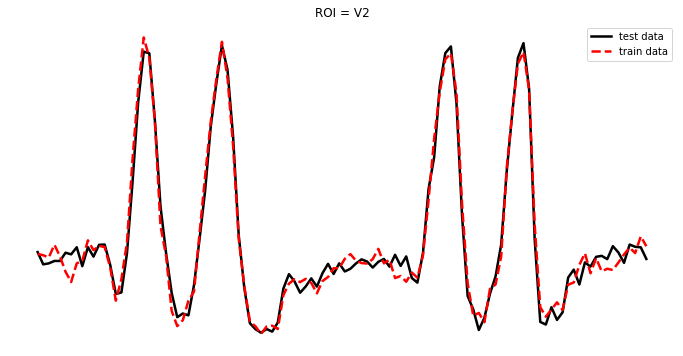

In [98]:
toplot = np.zeros([118584,])
toplot[:] = False
toplot[boolmask] = testmask
inds = np.where(toplot)[0]

for i in range(1):
    i=i
    s = df['region'][df['regionID']== atlas_data_both_hemis[inds[i]].astype(int)]

    Rgauss = np.round(round(cf_cortical[:,-3][testmask][i], 2), 2)
    Rdn = np.round(round(dncf_cortical[:,-3][testmask][i], 2), 2)
    plt.figure(figsize=[12,6])
    plt.plot(mydat_test[boolmask][testmask][i], label='test data', linestyle='-', color='black', linewidth=2.5)
    plt.plot(mydat_train[boolmask][testmask][i], label='train data', linestyle='--', color='red', linewidth=2.5)

    plt.xlabel('time')
    plt.ylabel('BOLD response (z-score)')
    plt.title(f'ROI = {s.values[0]}')

    plt.legend()
    plt.axis('off')
    plt.savefig('/tank/klundert/timecourse.png')

IndexError: index 0 is out of bounds for axis 0 with size 0

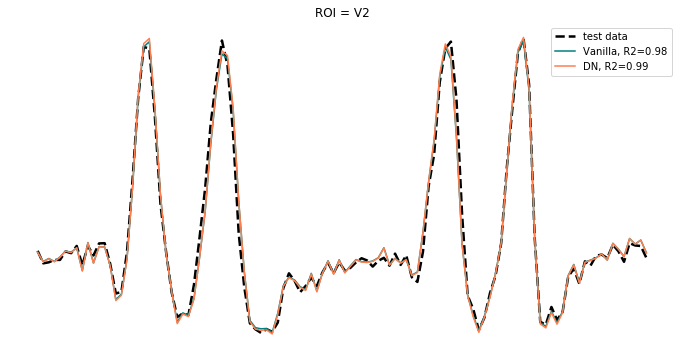

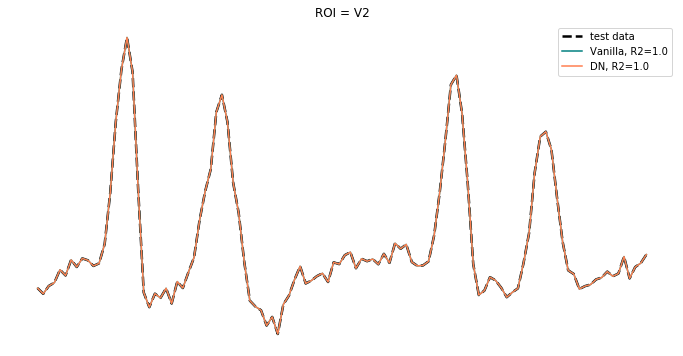

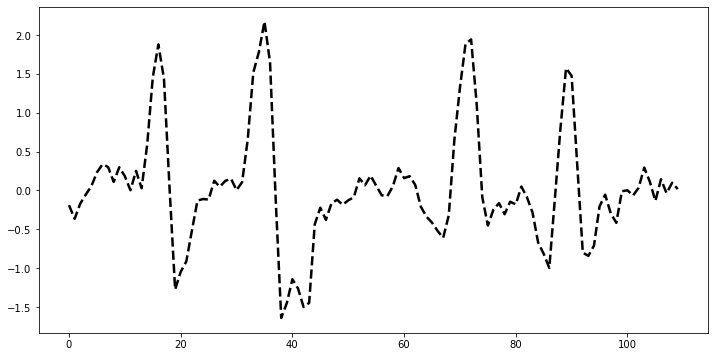

In [103]:
## only works for 1 sub at a time (cant average vertex idx)

toplot = np.zeros([118584,])
toplot[:] = False
toplot[boolmask] = testmask
inds = np.where(toplot)[0]

for i in range(10):
    i=i
#     s = df['region'][df['regionID']== atlas_data_both_hemis[inds[i]].astype(int)]

    Rgauss = np.round(round(cf_cortical[:,-3][testmask][i], 2), 2)
    Rdn = np.round(round(dncf_cortical[:,-3][testmask][i], 2), 2)
    plt.figure(figsize=[12,6])
    plt.plot(mydat_test[boolmask][testmask][i], label='test data', linestyle='--', color='black', linewidth=2.5)
#     plt.plot(mydat_train[boolmask][testmask][i], label='train data', linestyle='--', color='red', linewidth=2.5)

    plt.plot(model.return_prediction(*cf_cortical[testmask][i,:-3]).T, label=f'Vanilla, R2={Rgauss}', c='teal')
    plt.plot(gfdn.return_prediction(*dncf_cortical[testmask][i,:-3]).T, label=f'DN, R2={Rdn}', c='coral')
    plt.xlabel('time')
    plt.ylabel('BOLD response (z-score)')
    plt.title(f'ROI = {s.values[0]}')

    plt.legend()
    plt.axis('off')
    plt.savefig('/tank/klundert/timecourse.png')
